# DAMERAU-LEVENSHTEIN


## Clustering techniques on protein families


#### Aim of the project

The aim of the project is to apply the PCA clustering algorithm to the sequences associated to a certain PFAM to see whether they are connected to a taxonomic level (order, family or genus) of the proteome to which they belong or not.

#### Assignments

* define a proper distance between strings of possibly different lengths (e.g. maximum overlap)
* calculate the distance between each pair of nucleotidic sequence thus building the distance matrix
* apply the PCA to this matrix
* colour the points in the first two principal components according to a fixed taxonomic level (TaxaTab)

## Data pre-processing


#### Sequences database

The database *SequencesCorePFAM_PF0053.txt* should contain 

* in odd lines the information on the proteome to which the PFAM belongs and the protein in which it has been found.
* in even lines the amino-acid sequences associated to that PFAM in such a proteome.

We noticed that data were not as expected: some lines in the file were not ordered as "odd" and "even", so we made a small script to write a new file with the correct ordering

Then we realized that we would rather have the information contained in the column *Proteome_&_Protein_ID*, split into two different columns: proteomes and protein IDs.


#### TaxaTab database

In the database *TaxaTab_proteomes_bacteria.csv* all rows had the same values for both "superkingdom" and "kingdom". So we discarded them, as they were non informative.

As a final step, we merged the two datasets into one single dataset, on which we associated a taxonomic address to each proteome ID

In [12]:
#package-importing cell 
import numpy as np
import pandas as pd
from scipy import signal
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.cluster import AgglomerativeClustering as AC
from sklearn.cluster import KMeans
from sklearn import mixture
from sklearn.decomposition import PCA
from sklearn import metrics
from sklearn.cluster import DBSCAN

In [13]:
import warnings; warnings.simplefilter('ignore')

##### the following cell is not to be run

    #loading file
    infile_name = "SequencesCorePFAM_PF00453.txt"
    infile = open(infile_name,'r')
    #line counter
    line_c = 0

    #support lists
    app_name = []
    app_seq = []

    #iterating along the file and filling lists
    for line in infile:

        line = line[:-1]
        if ">" in str(line):
            app_name.append(line)
        else:
            app_seq.append(str("\"" + line[1:-2] + "\""))
        line_c += 1

    infile.close()

    #writing to file
    outfile_name = "SequencesCorePFAM_PF00453_new.csv"
    outfile = open(outfile_name, 'w')
    outfile.write("Proteome_&_Protein_ID"+","+"Sequence\n")
    for i in range(len(app_name)):
        app = str(app_name[i]+ "," + app_seq[i] + "\n")
        outfile.write(app)

    outfile.close()

##### the following cell is not to be run

    #visualizing newly written file
    file_name = "SequencesCorePFAM_PF00453_new.csv"
    seq=pd.read_csv(file_name)
    #seq  #<- remove hastag to visualize seq

Here, we realized that when data is presented as we did, its usefulness is limited: we would rather have proteomes and protein IDs in separated columns. To do so, we implemented the following script.


##### the following cell is not to be run

    #here we defined two numpy arrays, in which we will save the pertaining parts of the strings
    #namely, the proteome ID and the protein ID
    proteome = np.array(app_name)
    protein = np.array(app_name)

    #simultaneous assignment by using split
    for i in range(len(proteome)):
        proteome[i], protein[i] = proteome[i][2:-1].split(".tsv/")

    #writing out

    outfile_name = "SequencesCorePFAM_PF00453_final.csv"
    outfile = open(outfile_name, 'w')
    outfile.write("Proteome,Protein_Id,Sequence" + "\n")
    for i in range(len(app_name)):
        app = str(proteome[i]+ ",\"" + protein[i] + "\"," + app_seq[i] + "\n")
        outfile.write(app)

    outfile.close()

In [14]:
#visualizing the properly separated dataframe
file_name = "SequencesCorePFAM_PF00453_final.csv"
prot=pd.read_csv(file_name)
#prot

In [15]:
#visualizing the taxonomic dataset
file_name = "TaxaTab_proteomes_bacteria.csv"
specie=pd.read_csv(file_name)

All rows have the same values for both "superkingdom" and "kingdom". As such, we discarded them, as they were non informative.

In [16]:
#dropping noninformative columns
specie = specie.drop(['superkingdom'], axis=1)
specie = specie.drop(['kingdom'], axis=1)

As a final step, we merged the two datasets into one single dataset, on which we associated a taxonomic address to each proteome ID.

In [17]:
#using merge to unite the datasets
specie = specie.rename(index=str, columns={"ncbi ID": "Proteome"})
final = pd.merge(prot,specie, on="Proteome")
final

,Proteome,Protein_Id,Sequence,Scientific.Name,phylum,class,order,family,genus,species
0,1000565,F5REM1,RVKRGVTARARHKKVLDQAKGYRGRRKSVYRIAKEAVMKAGQYAYR...,Methyloversatilis universalis FAM5,Proteobacteria,Betaproteobacteria,Nitrosomonadales,Sterolibacteriaceae,Methyloversatilis,Methyloversatilis universalis
1,1000569,F9MPY1,RIKVGVTAHARHKKIVKMAKGYRGTRSRLFKKANESVMKALFYARR...,Megasphaera sp. UPII 135-E,Firmicutes,Negativicutes,Veillonellales,Veillonellaceae,Megasphaera,Megasphaera sp. UPII 135-E
2,1001240,A0A099JN25,RVKRAVNAHKKRRVILERAKGYRGQRSRLVRKAKEQVTHSFVYSYR...,Cryobacterium roopkundense,Actinobacteria,Actinobacteria,Micrococcales,Microbacteriaceae,Cryobacterium,Cryobacterium roopkundense
3,1001886,A0A090RDG9,RVKRGVQARARHKKVLKQAKGYYGARSRVYRVAFQAVTKAGQYAYR...,Vibrio sp. C7,Proteobacteria,Gammaproteobacteria,Vibrionales,Vibrionaceae,Vibrio,Vibrio sp. C7
4,100226,O88058,RVKRAVNAHKKRRAILEQASGYRGQRSRLYRKAKEQVTHSLVYNYN...,Streptomyces coelicolor A3(2),Actinobacteria,Actinobacteria,Streptomycetales,Streptomycetaceae,Streptomyces,Streptomyces coelicolor
5,1002340,A0A0B4FBU3,RVKGGTTTHARHKKVIKAAKGYYGRRKNTFKVARQAVDKANQYATR...,Leisingera sp. ANG1,Proteobacteria,Alphaproteobacteria,Rhodobacterales,Rhodobacteraceae,Leisingera,Leisingera sp. ANG1
6,1002368,G9Z8M6,RVKRGVIARARHKKILKQAKGYYGARSRVYRVAFQAVIKAGQYAYR...,Yokenella regensburgei ATCC 43003,Proteobacteria,Gammaproteobacteria,Enterobacterales,Enterobacteriaceae,Yokenella,Yokenella regensburgei
7,1002672,F2I080,RVKRGQASHQKHKKVFKQAKGFRGRRKNTIRVAKQAVEKSLQYAYR...,Candidatus Pelagibacter sp. IMCC9063,Proteobacteria,Alphaproteobacteria,Pelagibacterales,Pelagibacteraceae,Candidatus Pelagibacter,Candidatus Pelagibacter sp. IMCC9063
8,1002804,F8KSE9,RVKTGVVRRRRHKKVLKQARGFYSGRRKHFRKAKEQLERSLCYAFR...,Helicobacter bizzozeronii CIII-1,Proteobacteria,Epsilonproteobacteria,Campylobacterales,Helicobacteraceae,Helicobacter,Helicobacter bizzozeronii
9,1002805,H5V8Y1,RVKTGVVRRRRHKKVLKQARGFFSGRRKHFRKAKEQLERSLCYAFR...,Helicobacter bizzozeronii CCUG 35545,Proteobacteria,Epsilonproteobacteria,Campylobacterales,Helicobacteraceae,Helicobacter,Helicobacter bizzozeronii


In order to check the maximum and minimum lengths of the strings at hand.

In [18]:
final['lengths'] = pd.Series(final['Sequence'].apply(len), index=final.index)

print("\nThe length of the longest string is: ", final['lengths'].max(),)
print("\nThe length of the shortest string is: ", final['lengths'].min(), "\n")


The length of the longest string is:  113

The length of the shortest string is:  27 



## Taking a look at the raw data

We performed a quick visual analysis of the data. Each sequence was classified on a taxonomic basis: we grouped the dataset on the basis of its more general informative feature, namely, _phylum_. We then plotted the distribution of the data with respect to the different _phyla_. The following plot shows such distribution.

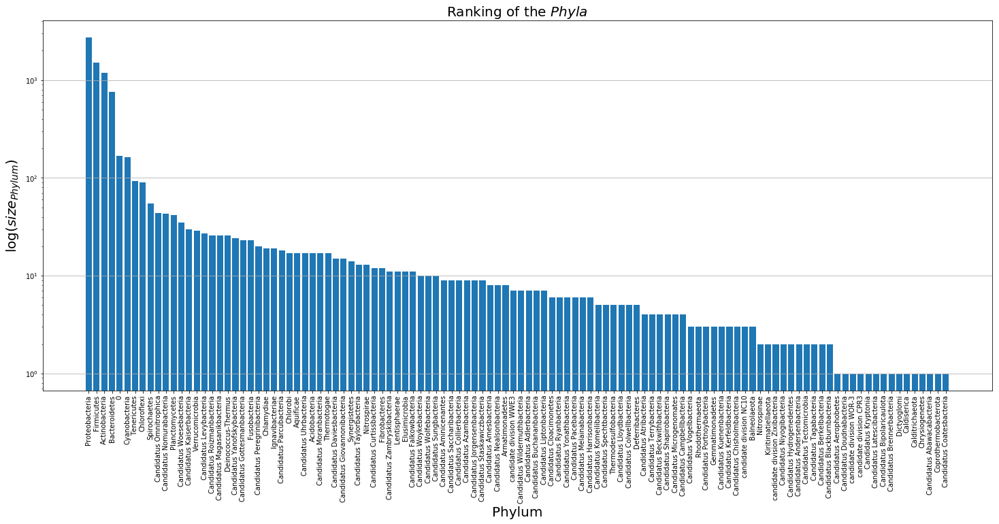

In [19]:
#ordering the phyla on the basis of the number of members in them
distr_phy_df=pd.DataFrame(final).groupby(['phylum']).count().sort_values(by='lengths', ascending=False)
distribution_phy = [distr_phy_df.index, distr_phy_df['lengths']]

#plotting the resulting distribution
plt.figure(figsize=(25,10))
plt.bar(distribution_phy[:][0],distribution_phy[:][1], log = True)
plt.xticks(rotation=90)
plt.xlabel("Phylum", fontsize=20)
plt.ylabel(r"$\log(size_{Phylum})$", fontsize=20)
plt.grid(axis='y')
plt.title(r'Ranking of the $Phyla$', fontsize=20)
plt.show()

We now plot the histogram of the various _Phyla_. The binning is logarithmic, as each _Phylum_ is placed in the bin whose range contains the number of elements in the _Phylum_ itself. The resulting histogram clearly shows that the dataset can be split in two parts:
 - many _Phyla_ contain few elements;
 - few _Phyla_ contain the majority of the elements.

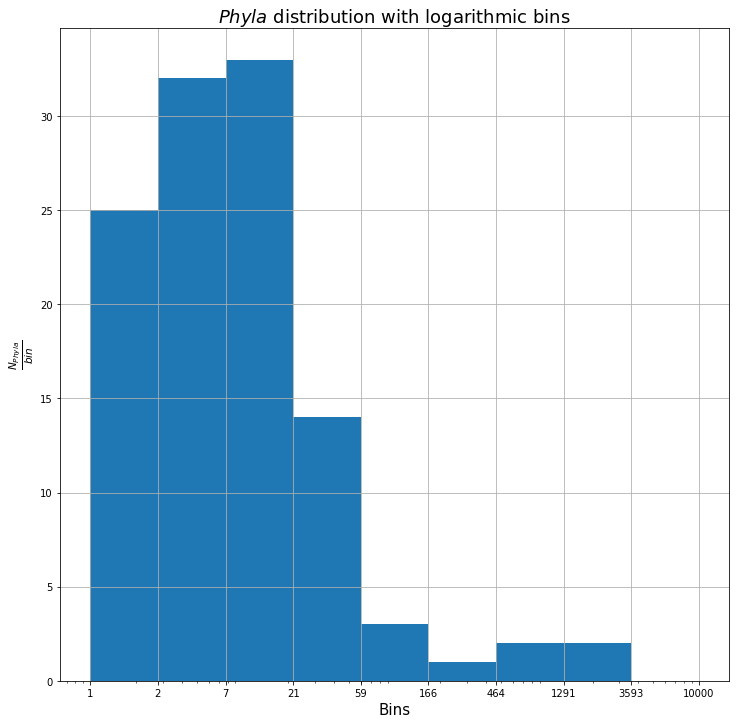

In [20]:
histo_phy_log = distr_phy_df['lengths'].values
bins=np.logspace(0,4,10)


plt.figure(figsize=(12,12))
plt.title(r"$Phyla$ distribution with logarithmic bins", fontsize=18)
plt.ylabel(r'$\frac{N_{Phyla}}{bin}$', fontsize=15)
plt.xlabel(r'Bins', fontsize=15)
plt.xscale(value='log')
plt.grid()
plt.xticks(bins, bins.astype(int))
plt.hist(histo_phy_log, bins=bins)
plt.show()

The overall distribution appears to be similar to a power law. One can quickly realize that a small minority of the _phyla_ are responsible for the majority of the whole dataset. As a consequence, the analysis can be restricted to a subset of the _phyla_, namely the minimum number of _phyla_ necessary to produce a (fixed and previously chosen) fraction of the whole dataset. 
Further classification was not studied, as adding more taxonomic identifiers would only fragment the dataset more; for all intents and purposes, a _phyla_-based classification is sufficient to suggest a power-law distribution of the data.

This reduction will be later employed, and it will prove to be useful, as it greatly reduces the number of "taxonomic" clusters, thus leading to more meaningful graphs.

__REMARK__ : the _phylum_ '0' was interpreted as a 'non-classification', and thus removed during later analysis as it was deemed non informative.

## Choosing a distance


#### Damerau–Levenshtein ansatz

The Damerau-Levenshtein distance is an *edit distance*, and, as such, is not based on a maximum overlap approach.
To express the Damerau–Levenshtein distance between two strings $a$ and $b$ a function $d_{a,b}(i,j)$ is defined, whose value is a distance between an $i$–symbol prefix (initial substring) of string $a$ and a $j$–symbol prefix of $b$.

The "restricted distance" function is defined recursively as:

$$
d_{a,b}(i,j) = 
\min 
\begin{cases}
0 & \text{if } i = j = 0 \\
d_{a,b}(i-1,j) + 1 & \text{if } i > 0 \\
d_{a,b}(i,j-1) + 1 & \text{if } j > 0 \\
d_{a,b}(i-1,j-1) + 1_{(a_i \neq b_j)} &  \text{if } i, j > 0\\
d_{a,b}(i-2,j-2) + 1 & \text{if } i, j > 1 \text{ and } a[i] = b[j-1] \text{ and } a[i-1] = b[j]\\
\end{cases}
$$

where  $1_{(a_i \neq b_j)}$ is the indicator function equal to 0 when  $a_i = b_j$ and equal to 1 otherwise.

Each recursive call matches one of the cases covered by the Damerau–Levenshtein distance:
* $d_{a,b}(i-1,j) + 1$ corresponds to a deletion (from a to b).
* $d_{a,b}(i,j-1) + 1$ corresponds to an insertion (from a to b).
* $d_{a,b}(i-1,j-1) + 1_{(a_i \neq b_j)}$ corresponds to a match or mismatch, depending on whether the respective symbols are the same.
* $d_{a,b}(i-2,j-2) + 1$ corresponds to a transposition between two successive symbols.

The Damerau–Levenshtein distance between $a$ and $b$ is then given by the function value for full strings: $d_{a,b}(|a|,|b|)$ where $i=|a|$ denotes the length of string $a$ and $j=|b|$ is the length of $b$.

## APPROACH TO DATA ANALYSIS

The following approach will be followed throughout the remainder of the notebook.

For each distance prescription:
 - we first compute the distance matrix, defined as the square matrix whose elements are the distances between each couple of strings;
 - we then perform PCA in order to reduce data dimensionality, and plot the different clusters that were obtained by both taxonomic classification and an unsupervised clustering (namely, a single link agglomerative clustering);
 - we then trimmed the dataset by both keeping only the most informative _phyla_ and by ditching the '0' _phylum_ and perform PCA and clustering on this new dataset.


# DAMERAU-LEVENSHTEIN DISTANCE

## Calculating the distance matrix

The distance matrix was calulated via some python macros specifically designed as to reduce and parallelize the computation as much as possible. The distance matrix is loaded in the following cell.

In [21]:
# opening data as a numpy array (of 2 dimensions)
data = np.loadtxt("damerau_levenshtein.csv", delimiter=",", skiprows=1)

We now load the file in a DataFrame in order to make visualization easier.

In [22]:
Df=pd.DataFrame(data)
Df.columns.names = ['Sequences']
Df

Sequences,0,1,2,3,4,5,6,7,8,9,...,7776,7777,7778,7779,7780,7781,7782,7783,7784,7785
0,0.0,43.0,47.0,28.0,48.0,42.0,29.0,42.0,47.0,48.0,...,48.0,52.0,52.0,50.0,40.0,23.0,42.0,41.0,49.0,48.0
1,43.0,0.0,48.0,40.0,50.0,45.0,39.0,53.0,53.0,54.0,...,51.0,44.0,50.0,56.0,24.0,45.0,45.0,45.0,48.0,34.0
2,47.0,48.0,0.0,48.0,22.0,53.0,53.0,55.0,60.0,61.0,...,57.0,52.0,53.0,57.0,45.0,53.0,52.0,51.0,55.0,50.0
3,28.0,40.0,48.0,0.0,47.0,41.0,11.0,42.0,48.0,49.0,...,48.0,44.0,48.0,50.0,41.0,27.0,41.0,40.0,48.0,45.0
4,48.0,50.0,22.0,47.0,0.0,57.0,44.0,57.0,53.0,54.0,...,58.0,52.0,53.0,59.0,47.0,52.0,56.0,56.0,55.0,48.0
5,42.0,45.0,53.0,41.0,57.0,0.0,46.0,40.0,54.0,55.0,...,48.0,60.0,56.0,51.0,48.0,38.0,1.0,8.0,49.0,55.0
6,29.0,39.0,53.0,11.0,44.0,46.0,0.0,45.0,47.0,48.0,...,47.0,45.0,46.0,50.0,37.0,29.0,46.0,45.0,47.0,42.0
7,42.0,53.0,55.0,42.0,57.0,40.0,45.0,0.0,51.0,51.0,...,49.0,61.0,58.0,50.0,57.0,44.0,40.0,43.0,54.0,54.0
8,47.0,53.0,60.0,48.0,53.0,54.0,47.0,51.0,0.0,1.0,...,50.0,54.0,52.0,55.0,50.0,48.0,53.0,52.0,46.0,52.0
9,48.0,54.0,61.0,49.0,54.0,55.0,48.0,51.0,1.0,0.0,...,50.0,55.0,52.0,56.0,51.0,49.0,54.0,53.0,47.0,53.0


## Preliminary analysis on the distance matrix

The distance matrix we obtained by using the Damerau-Levenshtein distance can be analyzed via a histogram. The result will be a distribution of the distances, from which one can obtain the likelihood of a given distance.

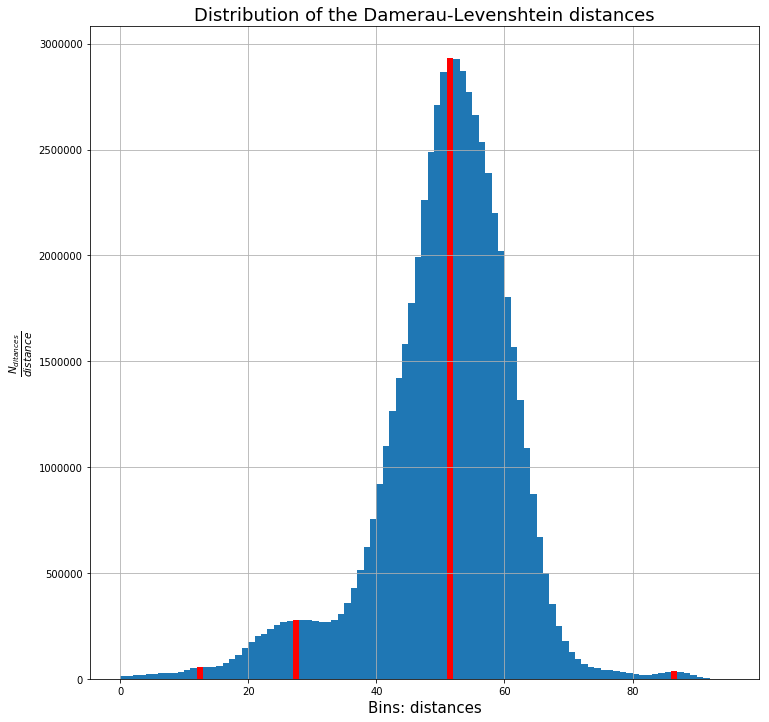

The peak distances are the following: 
 [12 27 51 86]


In [23]:
data_hist = data.flatten()
bins = (np.amax(data_hist)-np.amin(data_hist)).astype(int)

fig, ax = plt.subplots(figsize=(12,12))

plt.xlabel(r'Bins: distances', fontsize=15)
plt.ylabel(r'$\frac{N_{ditances}}{distance}$', fontsize=15)
plt.title('Distribution of the Damerau-Levenshtein distances', fontsize=18)
plt.grid()

N, _, patches = ax.hist(data_hist, bins = bins)

#finding the peaks
dt_hst, _ = np.histogram(data_hist, bins=bins)
max_indx = signal.find_peaks(dt_hst)

#plotting the peaks
for i in max_indx[0]:
    patches[i].set_facecolor('r')
    
plt.show()

print("The peak distances are the following: \n", max_indx[0])

This histogram represents the distribution of the different distances in the matrix. The most frequent distances appear to be 51 and 52 and other values seem to distribute around them. One can also see that there are other smaller peaks, which may be indicative of a "tipical" size for the sequences groups.

In any case, this histogram can be used to find the distance probability distribution.

## PCA on the whole dataset

In [24]:
# evaluating pca, only keeping 2 components

pca_function = PCA(n_components=2)
data_final = pca_function.fit_transform(data)

Results of the PCA procedure are now shown.

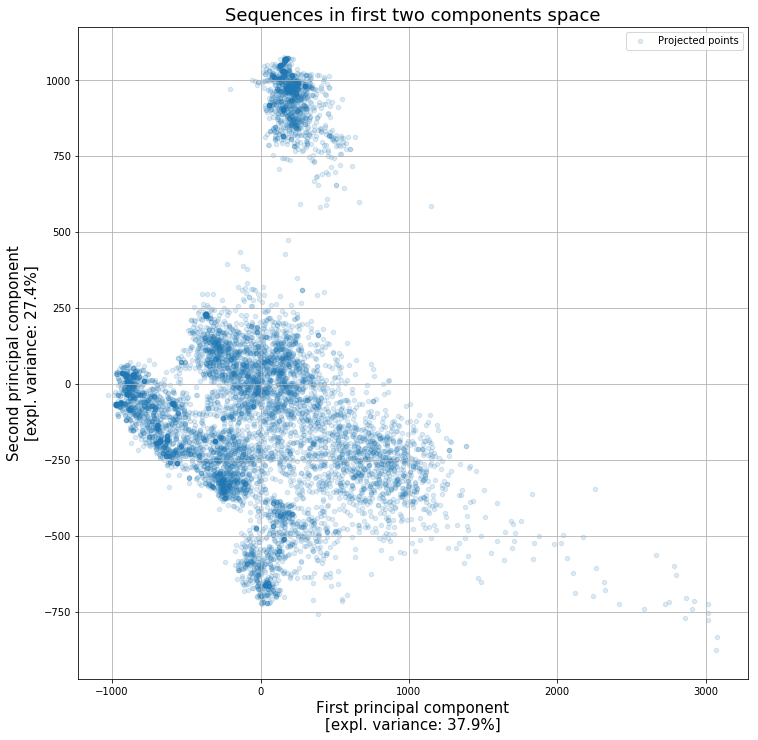

In [25]:
# plotting the whole PCA results on the whole matrix
fig, ax = plt.subplots(figsize = (12, 12))
plt.scatter(data_final[:,0], data_final[:,1], alpha=0.15, s=20, label='Projected points')

ax.set_title('Sequences in first two components space', fontsize = 18)
ax.set_xlabel('First principal component\n[expl. variance: ' 
              + str("{:.1f}".format(pca_function.explained_variance_ratio_[0]*100)) + '%]', fontsize = 15)
ax.set_ylabel('Second principal component\n[expl. variance: '
              + str("{:.1f}".format(pca_function.explained_variance_ratio_[1]*100)) + '%]', fontsize = 15)
boundx=ax.get_xbound()
boundy=ax.get_ybound()
ax.grid(True)
plt.legend()
plt.show()

Some clustering is apparent. We now prepare to plot each unique taxonomic group (up to the order) in order to see if they follow some form of clustering. Some utility follows.

In the next cell we are preparing some stuff that will be very useful during the analysis, such as the lists of the unique groups (phyla, classes, orders) that compare in the dataset and the corresponding indexes to faster locate them.

In [26]:
# Here we want to divide the sequences w.r.t. their classification:
# to do it, we consider the triplets of [phylum, class, order]

# reorganizing the data: each 'group...' array contains the indexes of the elements in each class
#each "by_..." array contains the names of the classes

group_phylum = []
by_phylum = np.unique(final["phylum"])
for phy in by_phylum:
    group_phylum.append(final.index[final["phylum"]==phy].tolist())

group_class = []
by_class = np.unique(final["class"])
for cla in by_class:
    group_class.append(final.index[final["class"]==cla].tolist())

group_order = []
by_order = np.unique(final["order"])
for order in by_order:
    group_order.append(final.index[final["order"]==order].tolist())

# list that will contain the list of different triplets
super_group = []

#we are selecting the unique triplets of which the dataset is composed.
for phy in by_phylum:
    for cla in np.unique(final[final["phylum"]==phy]["class"]):
        for order in np.unique(final[final["phylum"]==phy][final["class"]==cla]["order"]):
            super_group.append([phy,cla,order])

print("Number of phyla:\t", len(by_phylum))
print("Number of classes:\t", len(by_class))
print("Number of orders:\t", len(by_order))

# here we create the lists of indeces corresponding to every triplet
cluster = []
cluster2 = []
for index in super_group:
    cluster.append(final[final["phylum"]==index[0]][final["class"]==index[1]][final["order"]==index[2]].index.tolist())
    
super_group2 = []

#we are selecting the unique triplets of which the dataset is composed.
for phy in by_phylum:
    for cla in np.unique(final[final["phylum"]==phy]["class"]):
            super_group2.append([phy,cla,order])

for index2 in super_group2:
    cluster2.append(final[final["phylum"]==index2[0]][final["class"]==index2[1]].index.tolist())

Number of phyla:	 112
Number of classes:	 78
Number of orders:	 170


We now plot each phylum that has at least 50 elements (arbitrary choice) as a standalone graph.

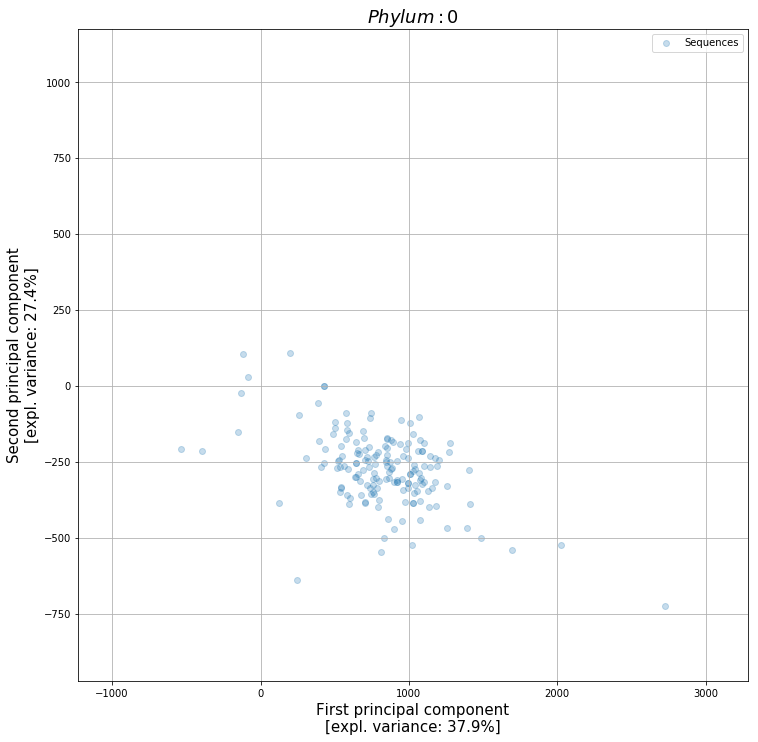

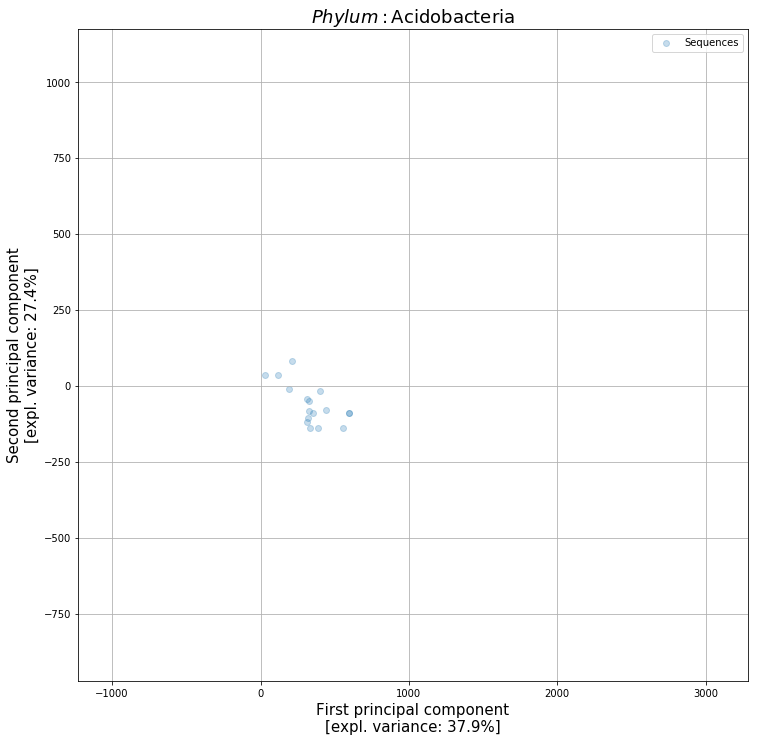

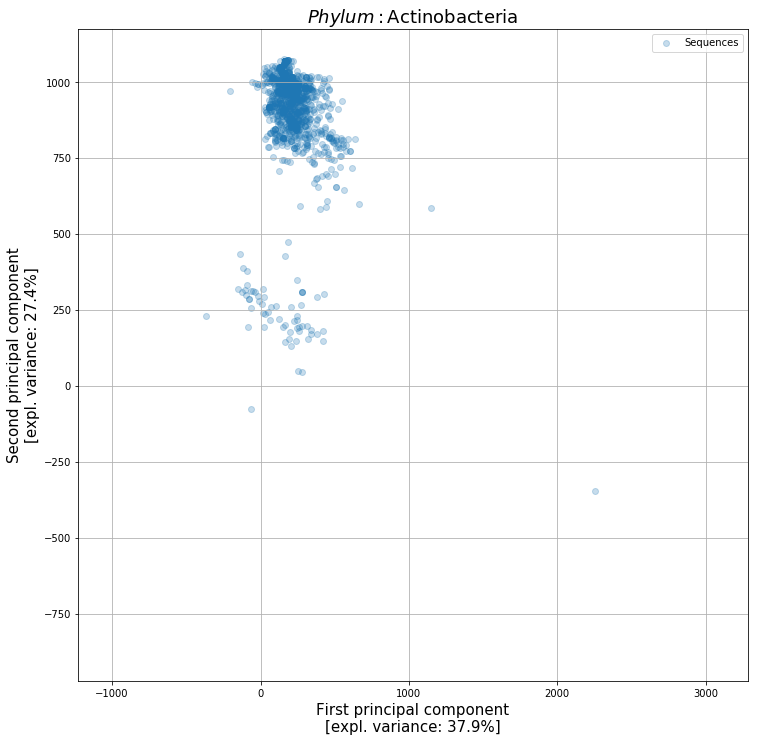

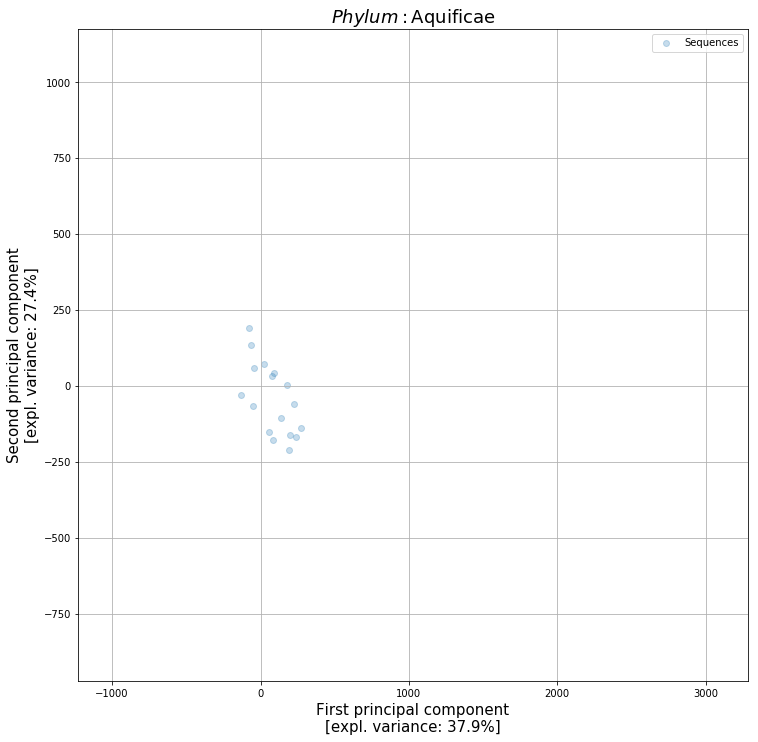

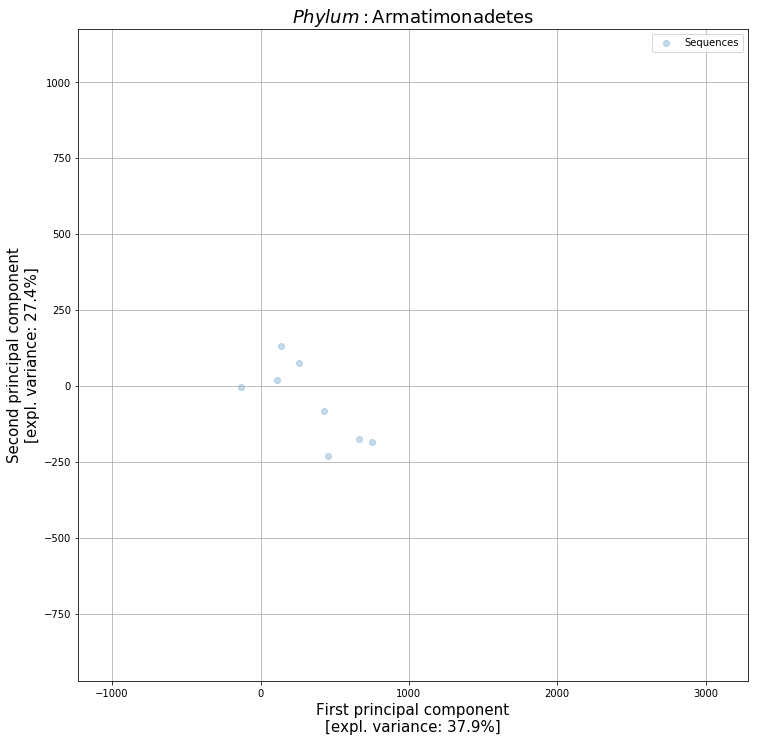

...

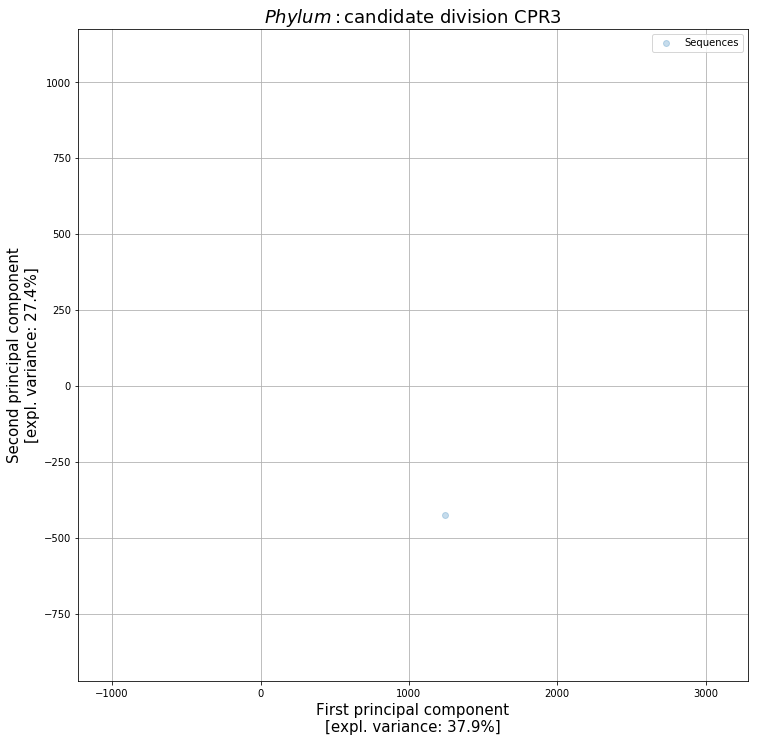

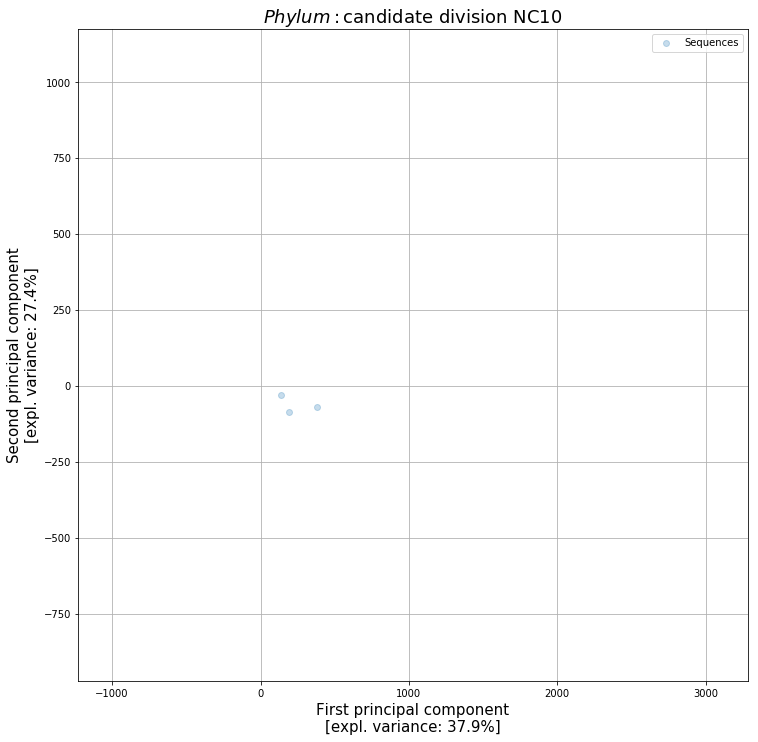

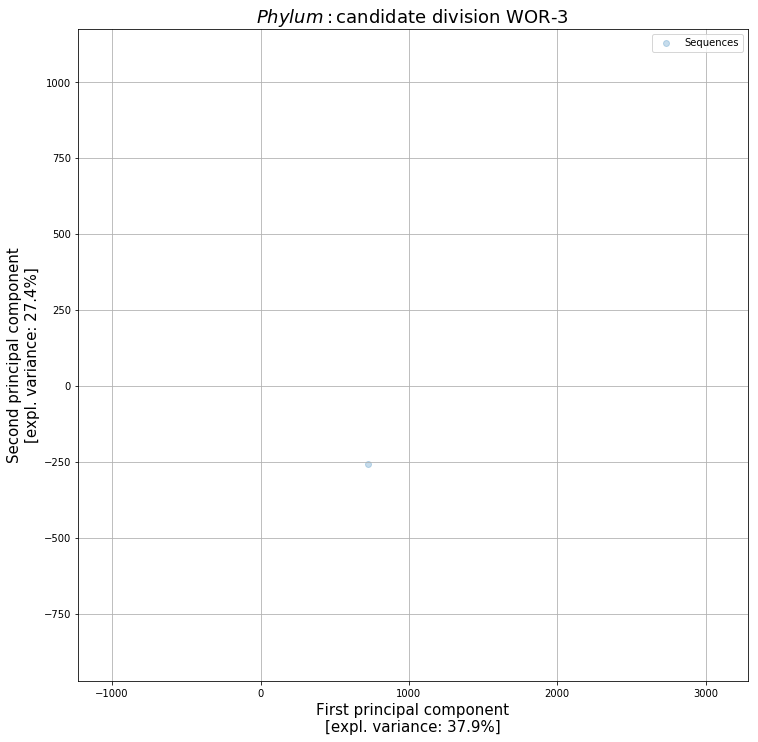

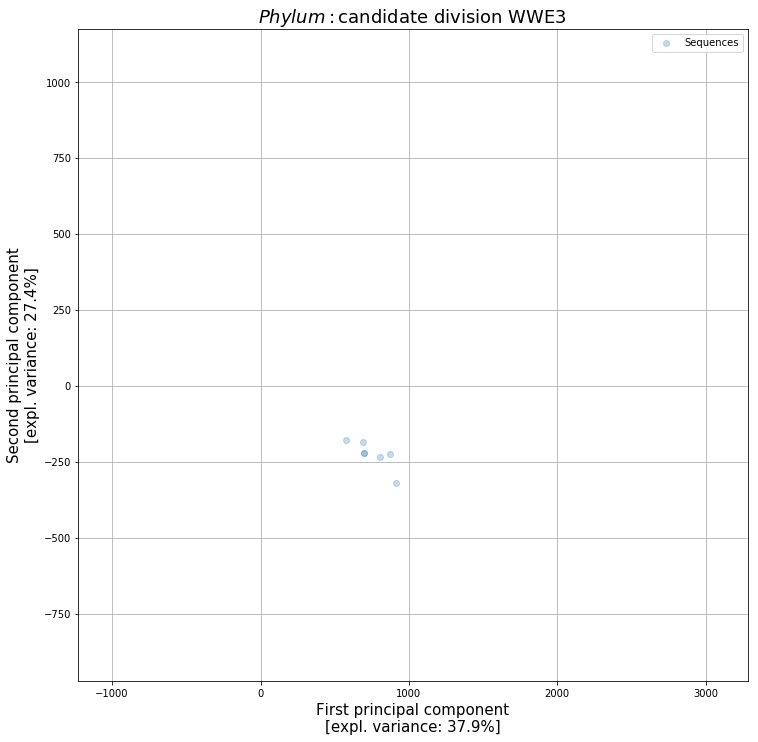

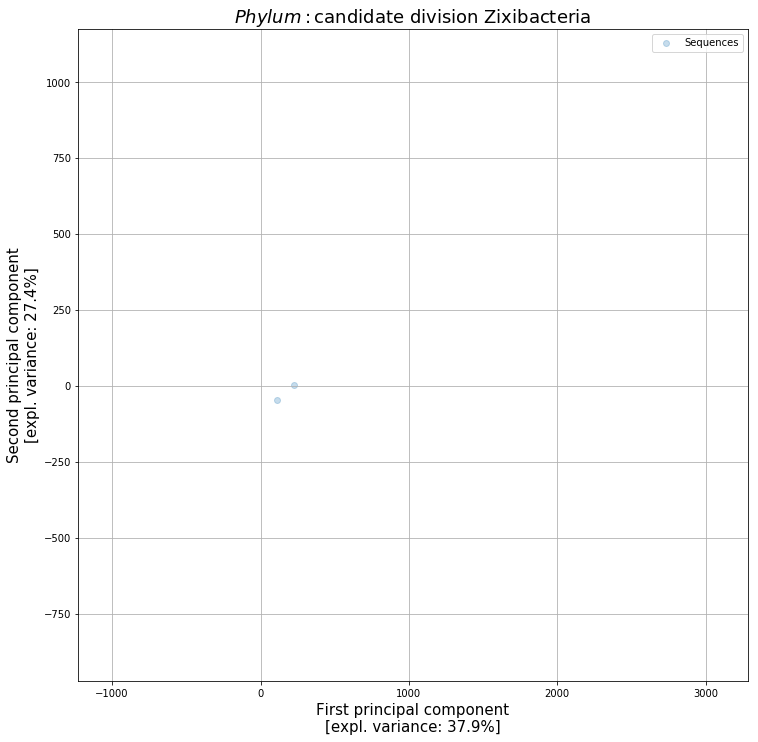

In [31]:
#plotting phyla groups of at least 50 elements

# preparing to plot
data_plot = []

# iterating in the phylum list and plotting the corresponding PCA data
for i_phy in range(len(group_phylum)):
    
    data_plot = []
    for i in group_phylum[i_phy]:
        data_plot.append(data_final[i].tolist())

    if len(data_plot) > 0:
        data_plot = np.array(data_plot)
        plt.figure(figsize=(12,12))
        plt.scatter(data_plot[:,0], data_plot[:,1], alpha=0.25, label = 'Sequences')
        # fixing figure dimensions to compare each data to the whole data distribution
        plt.ylim(boundy[0],boundy[1])
        plt.xlim(boundx[0],boundx[1])
        plt.grid()
        plt.xlabel('First principal component\n[expl. variance: ' 
              + str("{:.1f}".format(pca_function.explained_variance_ratio_[0]*100)) + '%]', fontsize = 15)
        plt.ylabel('Second principal component\n[expl. variance: '
              + str("{:.1f}".format(pca_function.explained_variance_ratio_[1]*100)) + '%]', fontsize = 15)


        plt.title(r'$Phylum:$' + str(final["phylum"][group_phylum[i_phy][0]]), fontsize = 18)
        plt.legend()
        # making the plot finish: a new plot will be made at every iteration
        plt.show()

We now plot each unique couple _Phylum-class_ whose members are more than 10 (as to prevent overcrowding) as a standalone graph. This subdivision of the dataset will prove to be rather interesting.

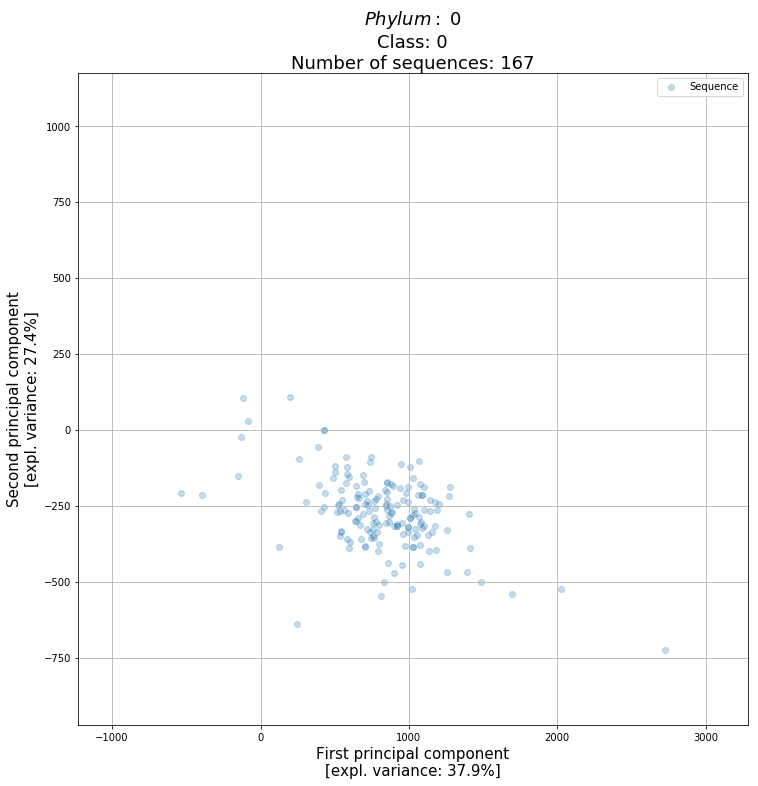

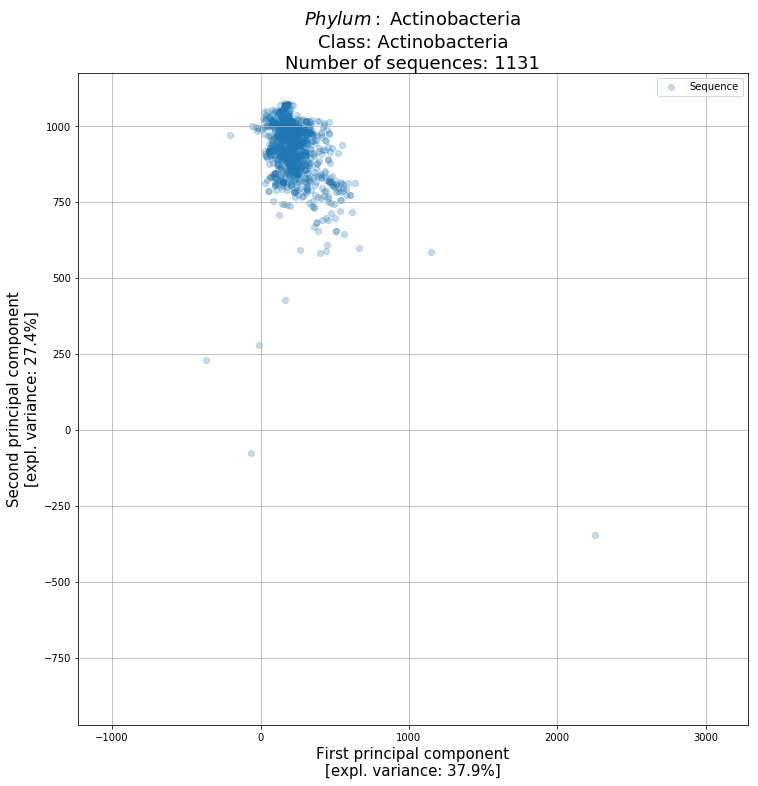

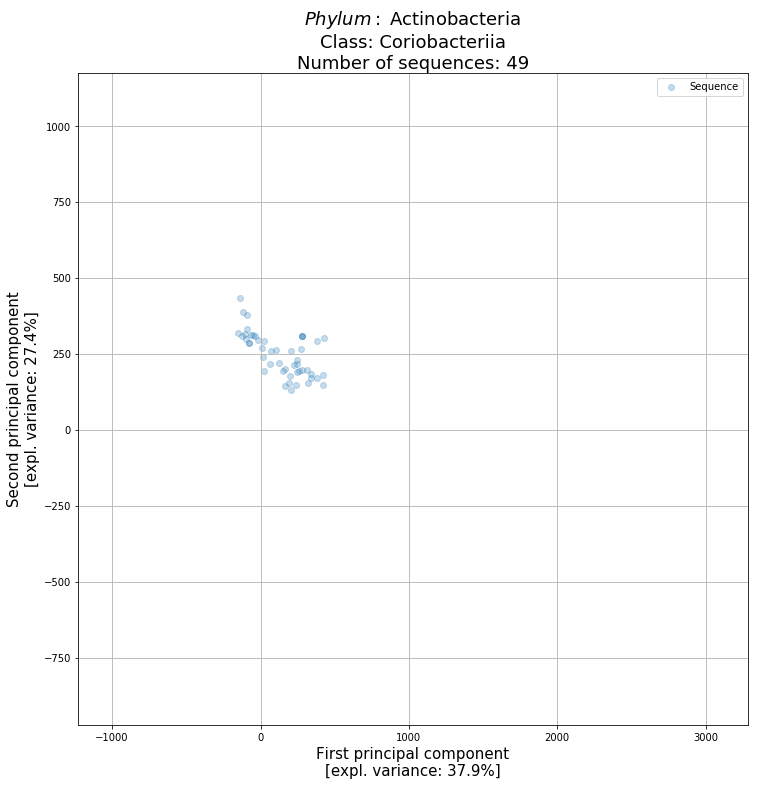

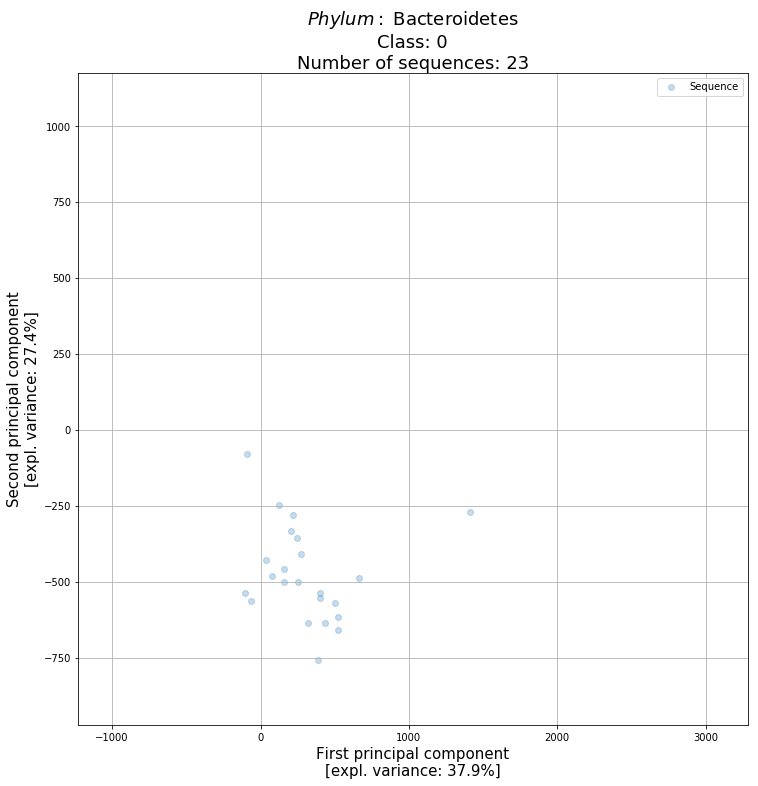

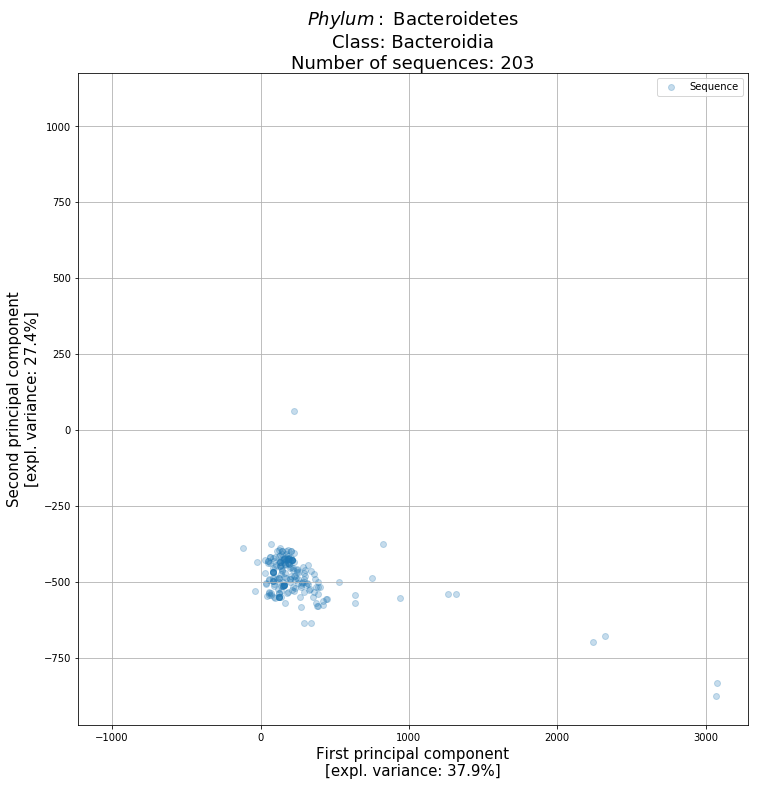

...

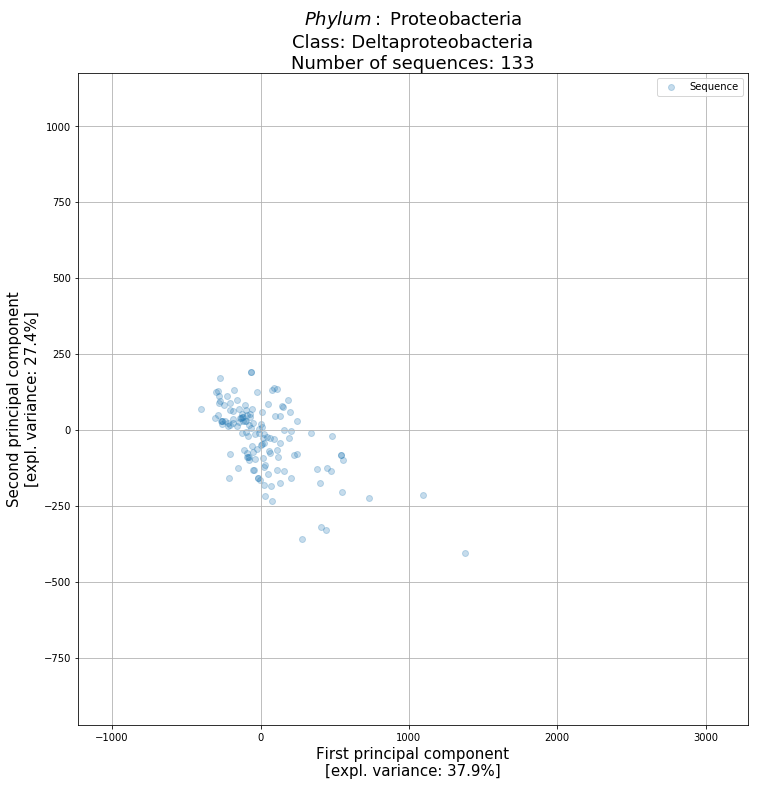

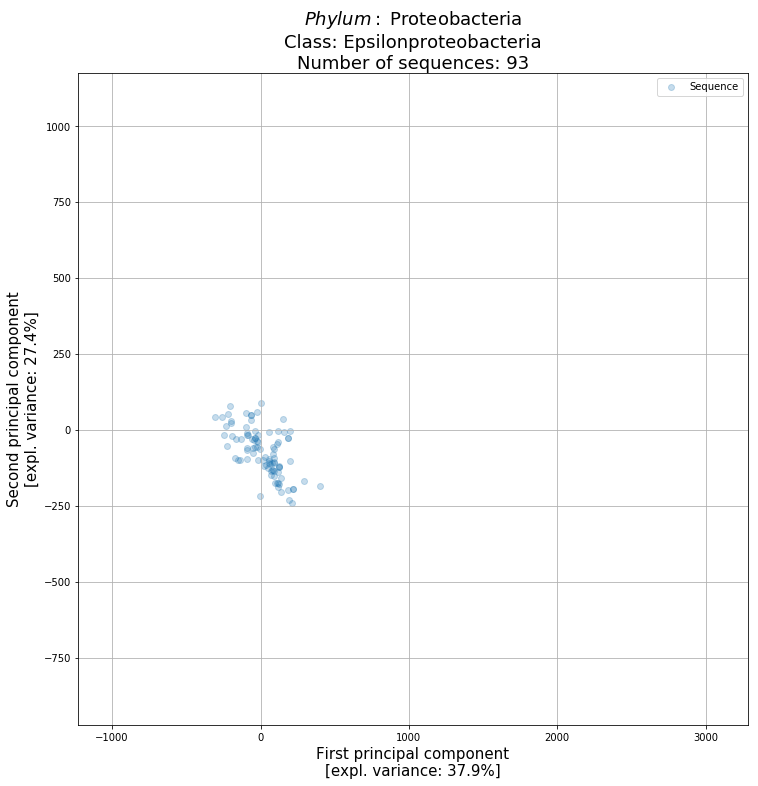

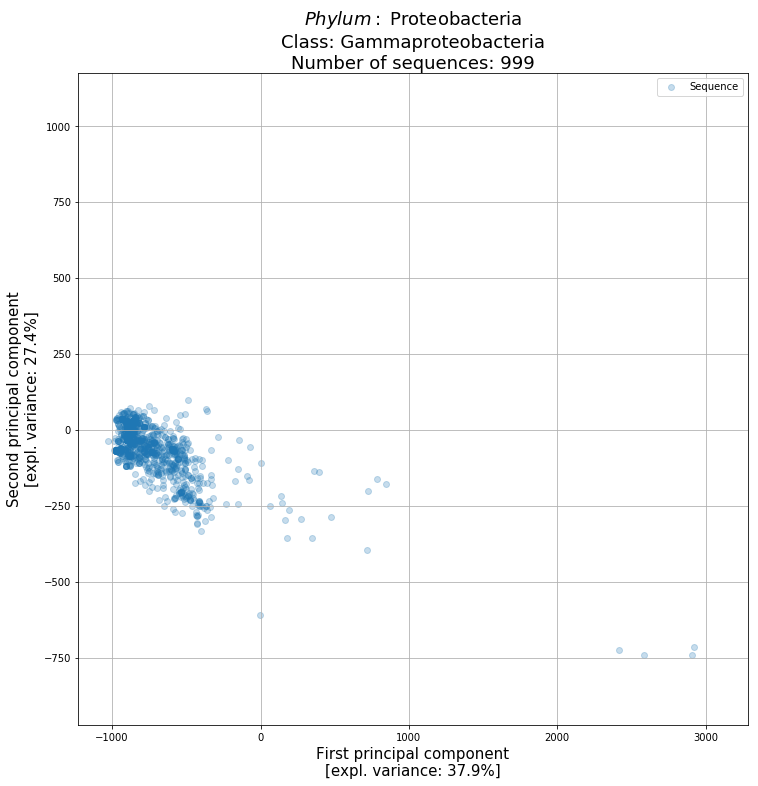

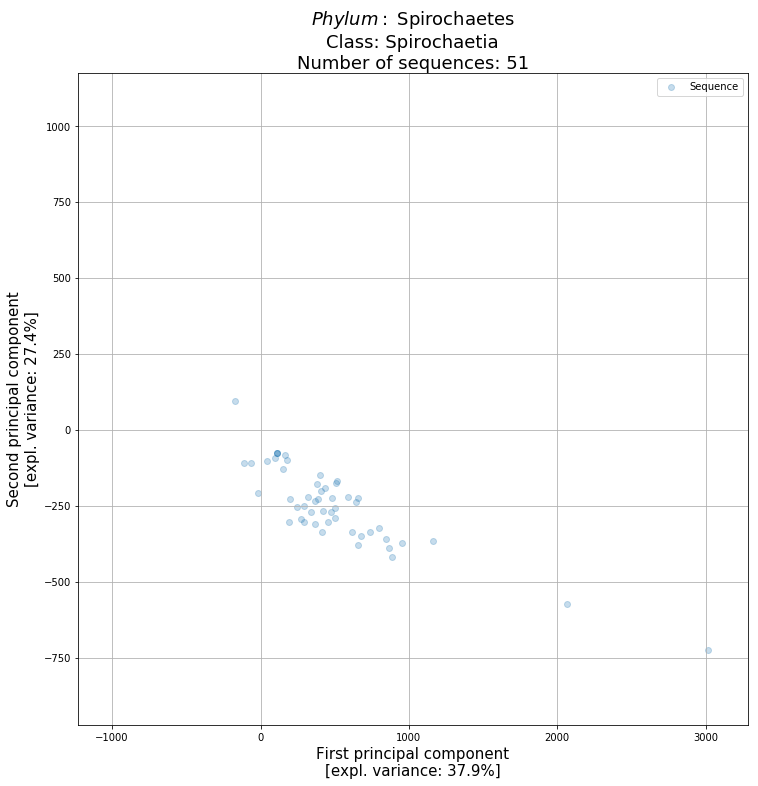

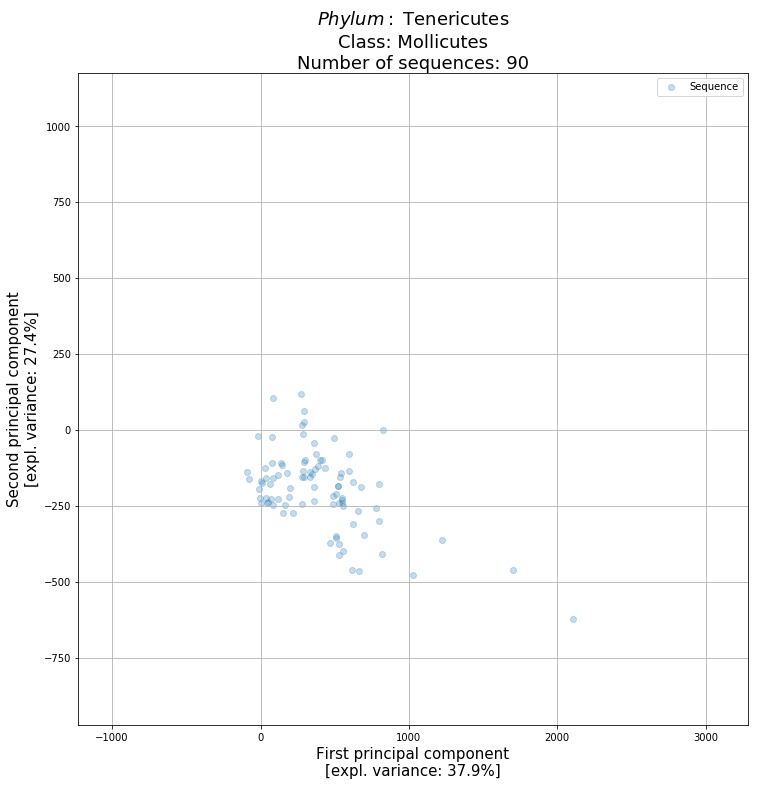

In [28]:
# plotting all plots of different triplets which have more than 10 points

for ambo,clust in zip(super_group2,cluster2):
    
    plot_data = data_final[clust]
    
    if len(plot_data)>20:
        plt.figure(figsize=(12,12))
        plt.grid()
        plt.xlabel('First principal component\n[expl. variance: ' 
              + str("{:.1f}".format(pca_function.explained_variance_ratio_[0]*100)) + '%]', fontsize = 15)
        plt.ylabel('Second principal component\n[expl. variance: '
              + str("{:.1f}".format(pca_function.explained_variance_ratio_[1]*100)) + '%]', fontsize = 15)
        plt.title(r'$Phylum:$ '+str(ambo[0])+'\nClass: '+str(ambo[1])+
                  '\nNumber of sequences: '+str(len(plot_data)), fontsize = 18)
        plt.scatter(plot_data[:,0],plot_data[:,1], alpha=0.25, label = 'Sequence')
        plt.legend()
        plt.ylim(boundy[0],boundy[1])
        plt.xlim(boundx[0],boundx[1])
        plt.show()


In the previous plots, the axes have always the same dimensions and limits: by looking at them one can notice that the _Phylum-Class_ representation of the data shows a very interesting "separation" between different classes.

A possible interpretation of this fact is that proteins developed in each organism belonging to the same _Phylum-class_ group are very similar to each other and "different" from those of other groups. This can (in a certain way) "confirm" the taxonomic classification done by biologists. 

We now plot each uninque triplet "Phylum, order, class" whose members are more than 10 (as to prevent overcrowding) as a standalone graph.

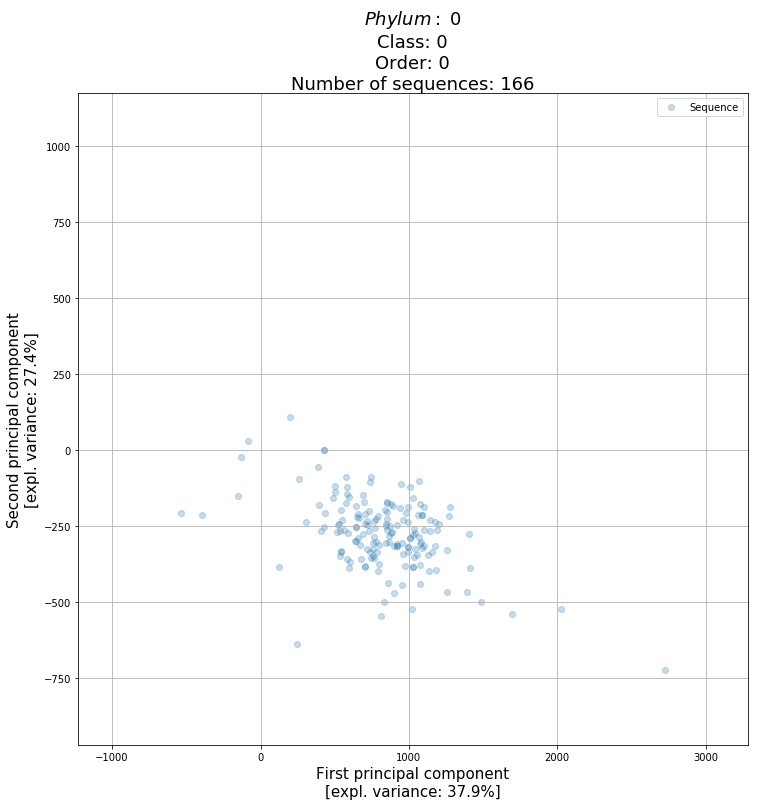

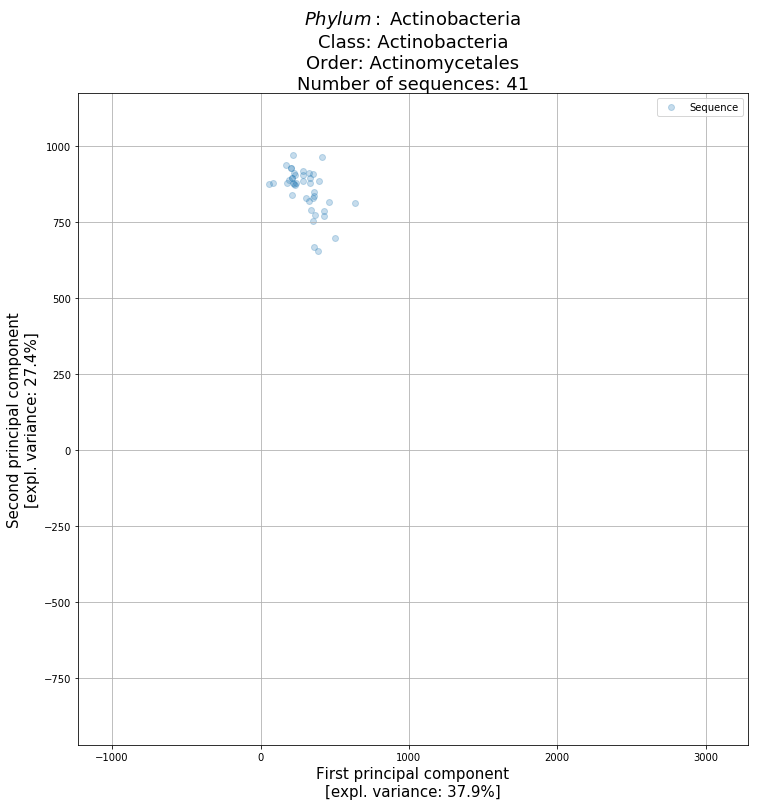

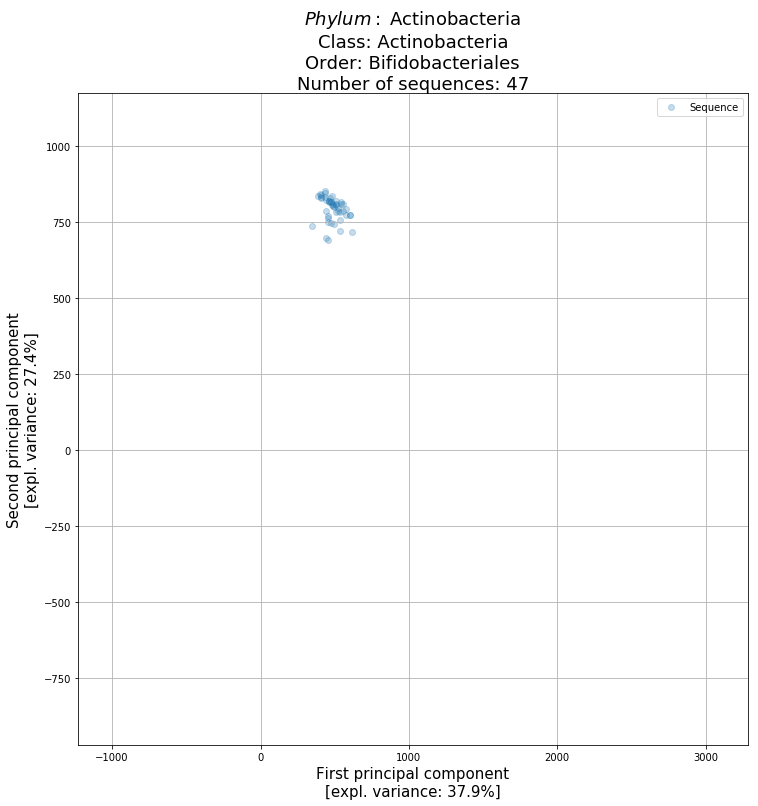

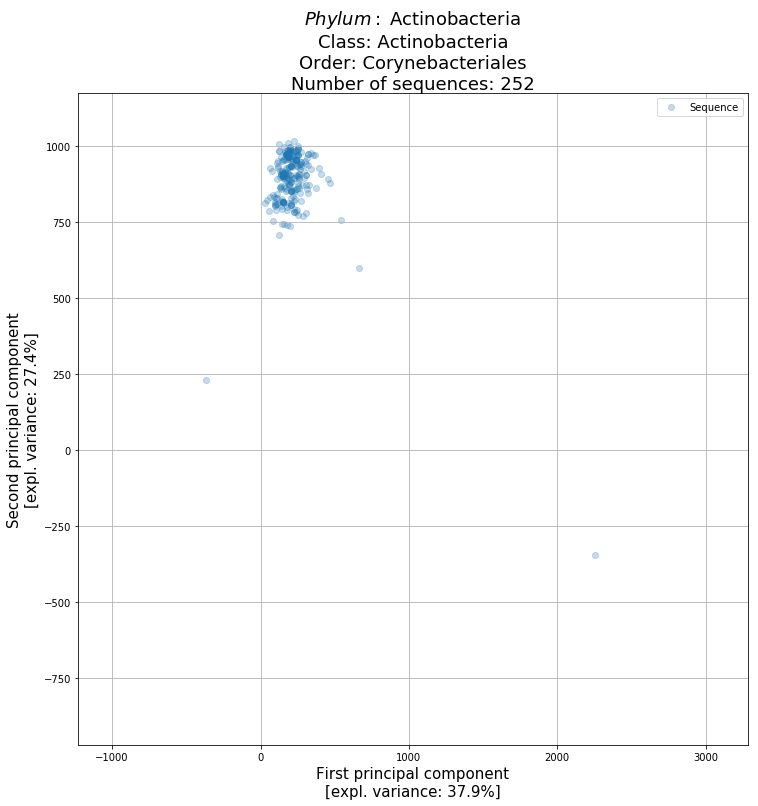

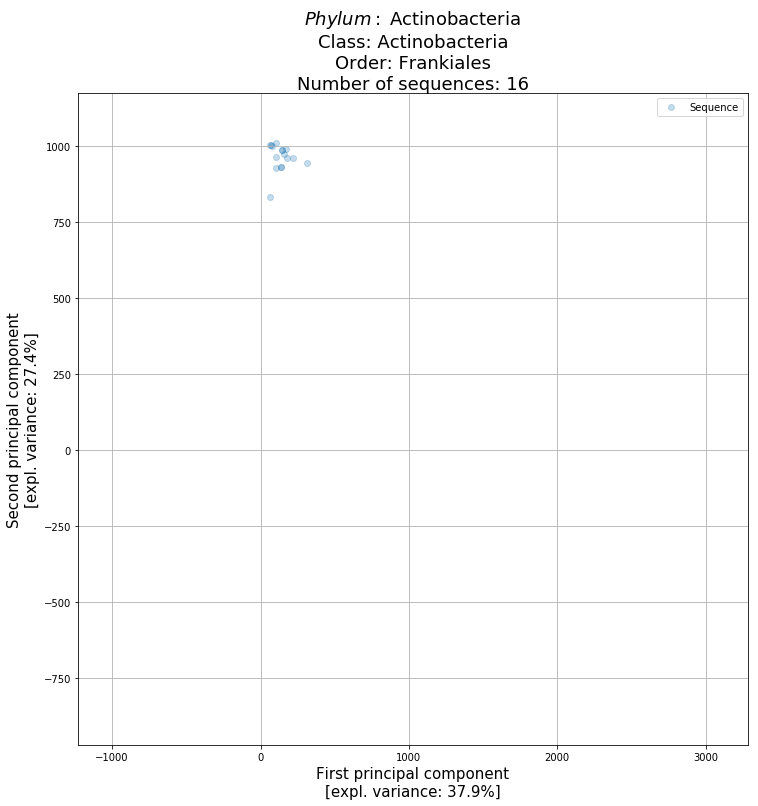

...

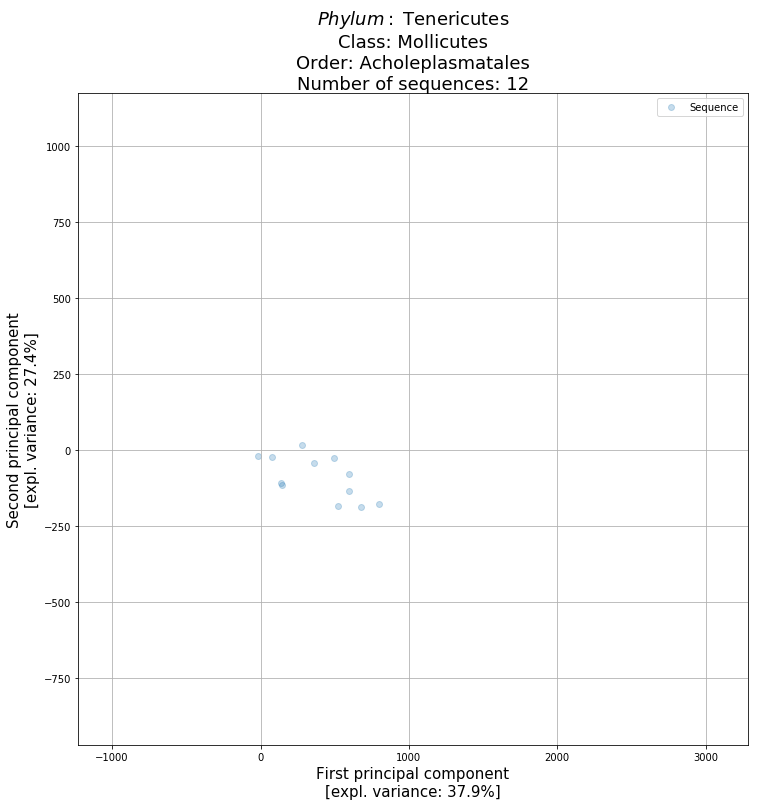

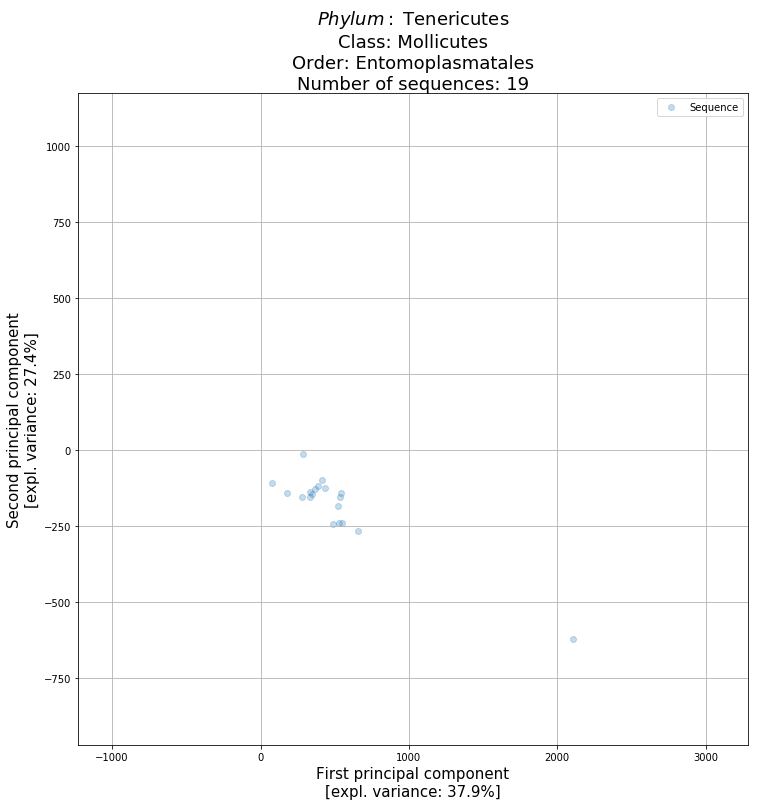

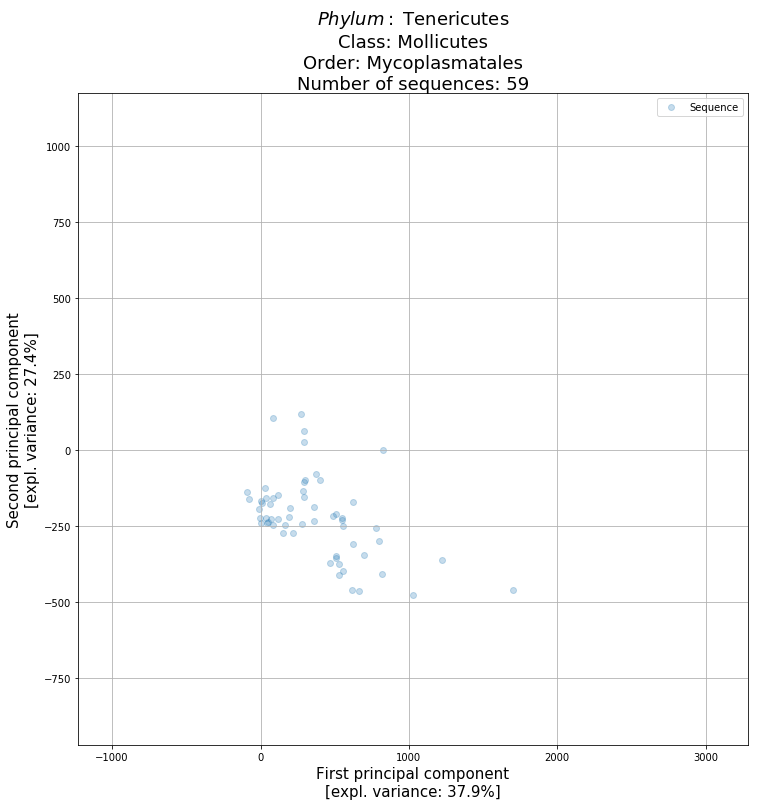

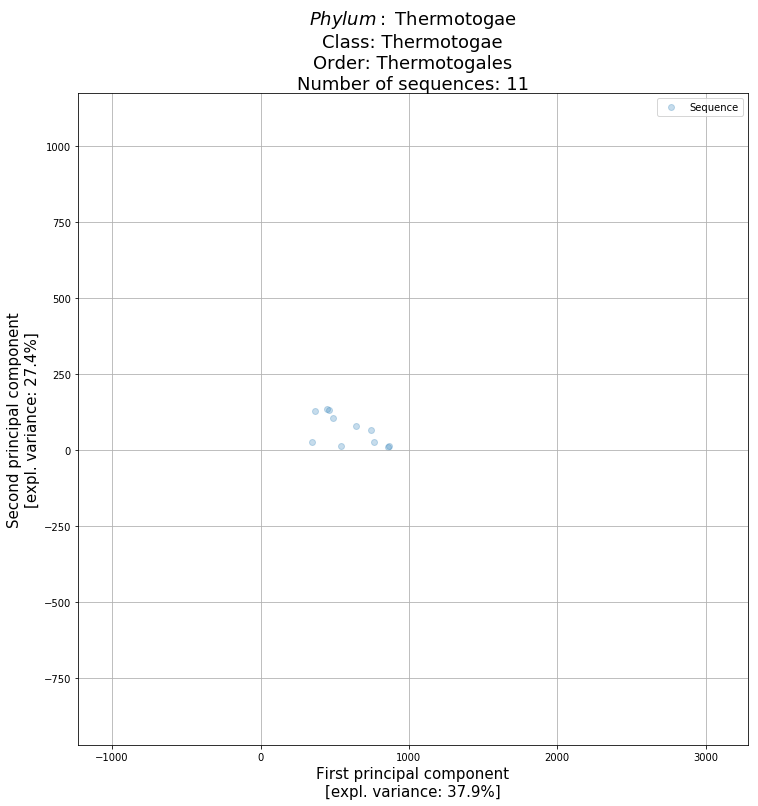

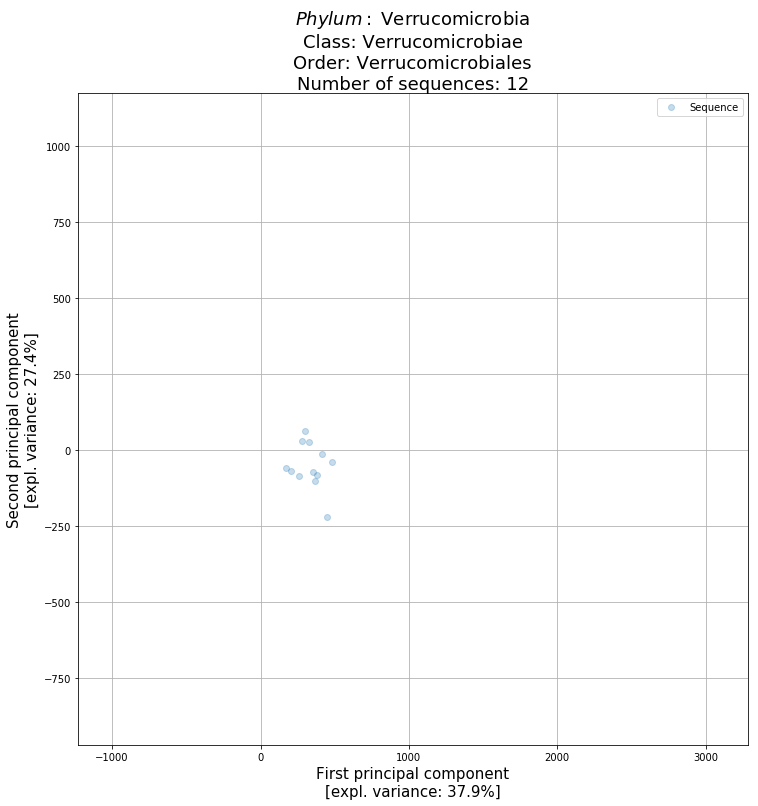

In [19]:
# plotting all plots of different triplets which have more than 10 points
for terna,clust in zip(super_group,cluster):
    
    plot_data = data_final[clust]
    
    if len(plot_data)>10:
        plt.figure(figsize=(12,12))
        plt.grid()
        plt.xlabel('First principal component\n[expl. variance: ' 
              + str("{:.1f}".format(pca_function.explained_variance_ratio_[0]*100)) + '%]', fontsize = 15)
        plt.ylabel('Second principal component\n[expl. variance: '
              + str("{:.1f}".format(pca_function.explained_variance_ratio_[1]*100)) + '%]', fontsize = 15)
        plt.title(r'$Phylum:$ '+str(terna[0])+'\nClass: '+str(terna[1])+
                  '\nOrder: '+str(terna[2])+'\nNumber of sequences: '+str(len(plot_data)), fontsize = 18)
        plt.scatter(plot_data[:,0],plot_data[:,1], alpha=0.25, label = 'Sequence')
        plt.legend()
        plt.ylim(boundy[0],boundy[1])
        plt.xlim(boundx[0],boundx[1])
        plt.show()


Again, we can notice that the data plotted in this way (excepted the non classified samples, denoted by '0') form groups.

Again, we can see this fact as a correct classification criteria by the biologists.

## Clustering

We now compare the clustering provided by some clustering functions (various agglomerative clustering algorithm from the scikit-learn package) with the one that arises when taxonomic classification is considered.

We decided to use the DBSCAN algorithm as it is one of the most widely used ones because of its ability of distinguishing the background from clusters (depending on the parameters the users pass to it).

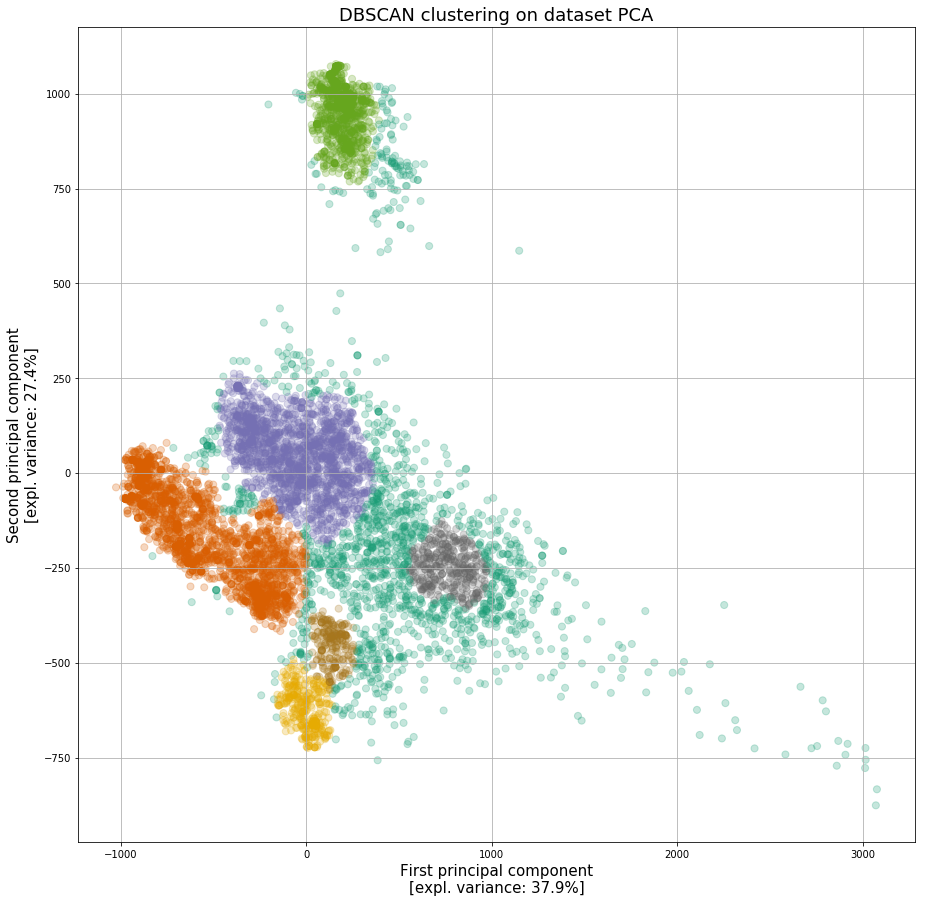

In [20]:
#unsupervised clustering, parameters to be chosen
db_func = DBSCAN(eps=64, min_samples=80).fit(data_final[:,0:2])
db_cluster=db_func.fit_predict(data_final[:,0:2])
plt.figure(figsize=(15,15))
plt.scatter(data_final[:,0], data_final[:,1], c=db_cluster, cmap="Dark2", s=50, marker="o",alpha=0.25)
plt.title(r"DBSCAN clustering on dataset PCA", fontsize=18)
plt.xlabel('First principal component\n[expl. variance: ' 
              + str("{:.1f}".format(pca_function.explained_variance_ratio_[0]*100)) + '%]', fontsize = 15)
plt.ylabel('Second principal component\n[expl. variance: '
              + str("{:.1f}".format(pca_function.explained_variance_ratio_[1]*100)) + '%]', fontsize = 15)
plt.grid()

plt.show()

Now, we perform a _Phyla_-based "clustering", meaning that we plot all _Phyla_ on the same graph. Hopefully, the clusters they form should approximately mirror the ones in the graph above.

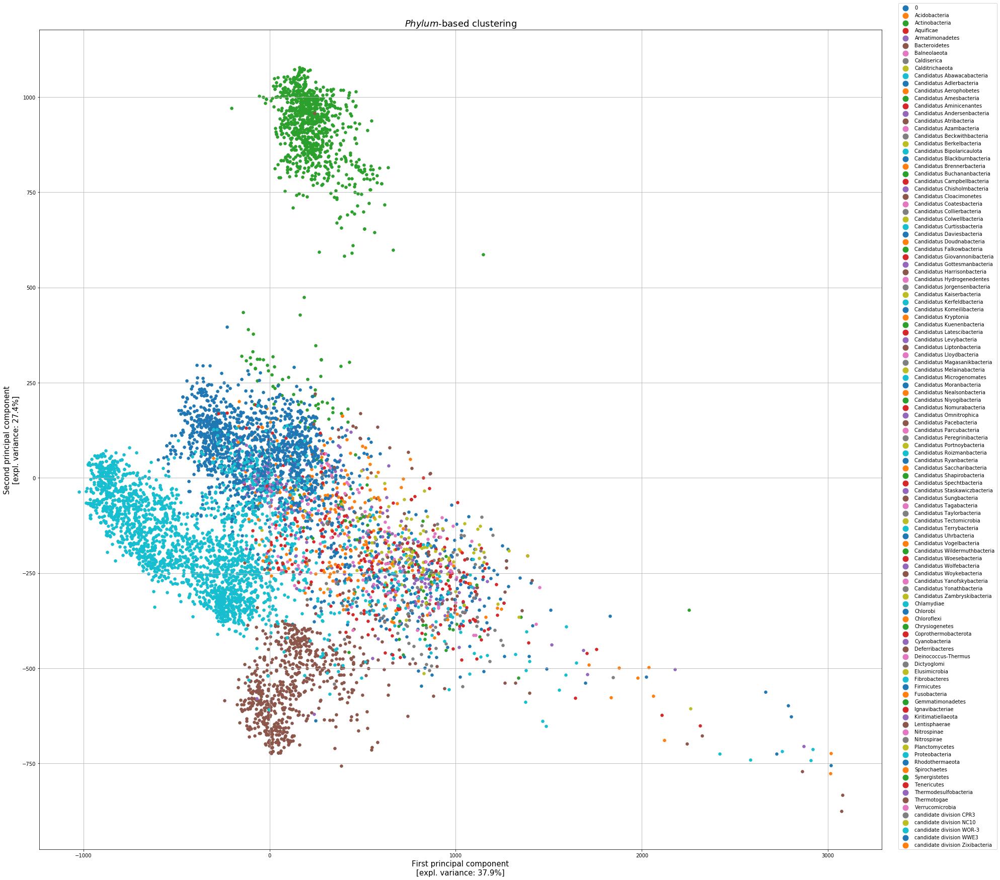

In [21]:
plt.figure(figsize=(30,30))
plt.title(r'$Phylum$-based clustering',fontsize = 18)
plt.xlabel('First principal component\n[expl. variance: ' 
              + str("{:.1f}".format(pca_function.explained_variance_ratio_[0]*100)) + '%]', fontsize = 15)
plt.ylabel('Second principal component\n[expl. variance: '
              + str("{:.1f}".format(pca_function.explained_variance_ratio_[1]*100)) + '%]', fontsize = 15)

for phy in np.unique(pd.DataFrame(final)['phylum']):
    data_plot = pd.DataFrame(final).index[pd.DataFrame(final)['phylum']==phy].tolist()
    plt.scatter(data_final[data_plot,0],data_final[data_plot,1], label = phy, s=30)

plt.legend(loc=(1.02,0), ncol=1, borderaxespad=0., markerscale=2)
plt.grid()
plt.show()

The sheer number of possible _Phyla_ clusters makes this kind of comparison rather pointless. The next step in our analysis aims to avoid this problem.

## PCA on the trimmed dataset

<a id='Return-from-phyla-graph'></a>
As already mentioned, we can use the power-law behaviour of the dataset with respect to _Phylum_-based grouping to ignore the sequences belonging to the "smaller" _Phyla_.

We therefore:
 - fixed an arbitrary threshold, which represents the fraction of the dataset to which we want to restrict our analysis to;
 - we removed the whole '0' _Phylum_, as it essentially is an unclassified set of sequences, and thus it is non-informative.
 
Utility for the trimming of the dataset follows.

In [22]:
#creating the lists of phyla numbers of members and phyla names
phy_len_sort = np.array([distribution_phy[1][i] for i in range(len(distribution_phy[1]))])
phy_name_sort = np.array([distribution_phy[0][i] for i in range(len(distribution_phy[1]))])
df = []
for (name,phy) in zip(phy_name_sort,phy_len_sort):
    df.append([name,phy])
    
pd.DataFrame(np.array(df), columns=('Phylum','Number_of_members'))

,Phylum,Number_of_members
0,Proteobacteria,2747
1,Firmicutes,1509
2,Actinobacteria,1190
3,Bacteroidetes,764
4,0,167
5,Cyanobacteria,162
6,Tenericutes,93
7,Chloroflexi,90
8,Spirochaetes,55
9,Candidatus Omnitrophica,44


We decided to first remove the '0' _phylum_, as it was deemed non-informative. Then, we fixed an arbitrary ratio of the dataset (with the '0' removed) to keep; the fraction of sequences to be eliminated were chosen from the smaller _phyla_. The result of this procedure is that a small decrease in the number of sequences was traded for a great reduction in the number of _phyla_ in the dataset, thus leading to more informative taxonomic clustering.

In [23]:
#removing the 0 phylum from the dataset

for i_phy in range(len(phy_name_sort)-1):
    if phy_name_sort[i_phy]=='0':
        phy_name_sort = np.delete(phy_name_sort, i_phy)
        phy_len_sort = np.delete(phy_len_sort, i_phy)
        
indexes_to_keep = final.index[final['phylum']!='0'].tolist()

In [24]:
# useful function
def iterFlatten(root):
    if isinstance(root, (list, tuple)):
        for element in root:
            for e in iterFlatten(element):
                yield e
    else:
        yield root

In [25]:
#removing the 0s
clean_data = data[indexes_to_keep]
clean_data = clean_data[:,indexes_to_keep]

#an arbitrarily chosen ratio
thresh = 0.9 
L = len(clean_data)

i=1
while np.sum(phy_len_sort[:i])<thresh*L:
    i+=1
    
phy_len_thresh = phy_len_sort[:i]
phy_name_thresh = phy_name_sort[:i]

#list of indexes corresponding to the phyla to keep
selection_90 = []
for name in phy_name_thresh:
    selection_90.append(final.index[final["phylum"]==name].tolist())
    
indexes_trimmed=list(iterFlatten(selection_90))

Before repeating the PCA on the trimmed dataset, we once again plot the _phylum_ based clustering on the previous PCA, this time showing only the numerically relevant _phyla_.

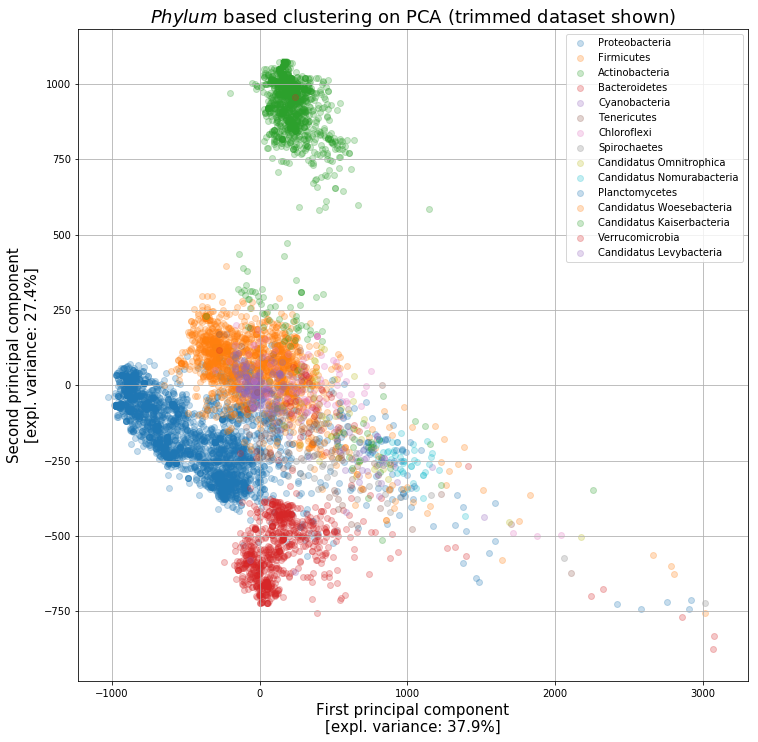

In [26]:
plt.figure(figsize=(12,12))
for phy in selection_90:
    data_plot = data_final[phy]
    plt.scatter(data_plot[:,0], data_plot[:,1], label=phy_name_thresh[selection_90.index(phy)], alpha=0.25)
    
plt.title(r"$Phylum$ based clustering on PCA (trimmed dataset shown)", fontsize=18)
plt.xlabel('First principal component\n[expl. variance: ' 
              + str("{:.1f}".format(pca_function.explained_variance_ratio_[0]*100)) + '%]', fontsize = 15)
plt.ylabel('Second principal component\n[expl. variance: '
              + str("{:.1f}".format(pca_function.explained_variance_ratio_[1]*100)) + '%]', fontsize = 15)
plt.grid()
plt.legend()
plt.show()

# New PCA on trimmed data

Here the PCA is performed on the trimmed dataset.

In [27]:
pca_function2 = PCA(n_components=2)

# evaluating pca
#data_projected_clean = pca_function2.fit_transform(clean_data)

# "trick" such that the list "indeces to keep" is still valid: building a matrix 7786,2 such that the projected data fit well in it
data_projected_clean = np.zeros((7786, 2))
data_projected_clean[indexes_trimmed] = pca_function2.fit_transform(data[indexes_trimmed][:,indexes_trimmed])
print(len(data_projected_clean))

7786


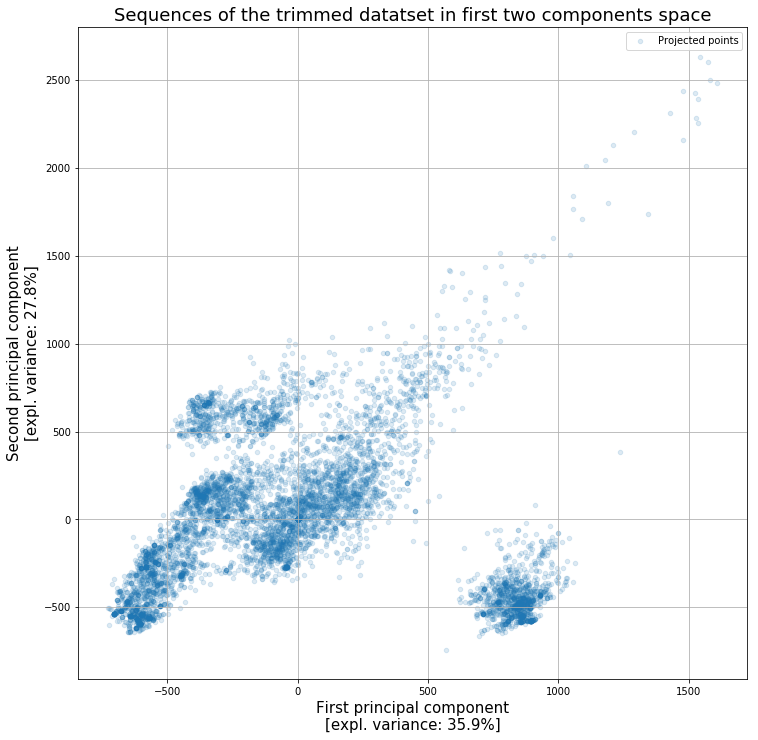

In [28]:
fig, ax = plt.subplots(figsize = (12, 12))
plt.scatter(data_projected_clean[:,0], data_projected_clean[:,1], alpha=0.15, s=20, label='Projected points')

ax.set_title('Sequences of the trimmed datatset in first two components space', fontsize = 18)
ax.set_xlabel('First principal component\n[expl. variance: ' 
              + str("{:.1f}".format(pca_function2.explained_variance_ratio_[0]*100)) + '%]', fontsize = 15)
ax.set_ylabel('Second principal component\n[expl. variance: '
              + str("{:.1f}".format(pca_function2.explained_variance_ratio_[1]*100)) + '%]', fontsize = 15)
boundx=ax.get_xbound()
boundy=ax.get_ybound()
ax.grid(True)
plt.legend()
plt.show()

The graph has changed, but the clustering appears to be conserved. We now plot the taxonomic clustering (based on the _phyla_) and the unsupervised one.

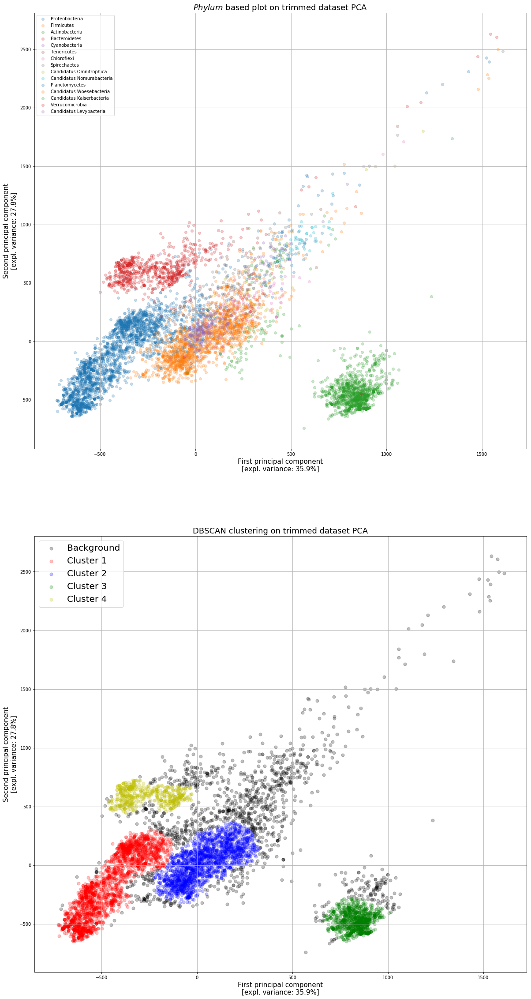

In [29]:
#dataframe_clean = final[final['phylum'].isin(phy_name_thresh)].reset_index()
#indexes_trimmed = []
#for phy in phy_name_thresh:
#    indexes_trimmed.append(dataframe_clean.index[dataframe_clean['phylum']==phy].tolist())


fig, (ax_t, ax_u) = plt.subplots(ncols = 1, nrows = 2, figsize = (20,40))

#phylum based clustering
for i_phy in range(len(phy_name_thresh)):
    data_plot = data_projected_clean[selection_90[i_phy]]
    ax_t.scatter(data_plot[:,0], data_plot[:,1], label=phy_name_thresh[i_phy], alpha=0.25)

ax_t.set_title(r"$Phylum$ based plot on trimmed dataset PCA", fontsize=18)
ax_t.set_xlabel('First principal component\n[expl. variance: ' 
              + str("{:.1f}".format(pca_function2.explained_variance_ratio_[0]*100)) + '%]', fontsize = 15)
ax_t.set_ylabel('Second principal component\n[expl. variance: '
              + str("{:.1f}".format(pca_function2.explained_variance_ratio_[1]*100)) + '%]', fontsize = 15)
ax_t.grid()
ax_t.legend()



#unsupervised clustering, parameters to be chosen


col=['k','r','b','g','y']
db_cluster=np.array([-2 for i in range(len(final))])
db_func = DBSCAN(eps=54, min_samples=60).fit(data_projected_clean[indexes_to_keep,0:2])
db_cluster[indexes_to_keep]=db_func.fit_predict(data_projected_clean[indexes_to_keep,0:2])


for i in range(-1,4):
    if i==-1:
        ax_u.scatter(data_projected_clean[np.where(db_cluster==i),0], data_projected_clean[np.where(db_cluster==i),1], 
                 label="Background", s=50, marker="o",alpha=0.25, c=col[i+1])
    else:
        ax_u.scatter(data_projected_clean[np.where(db_cluster==i),0], data_projected_clean[np.where(db_cluster==i),1], 
                 label="Cluster "+str(i+1), s=50, marker="o",alpha=0.25, c=col[i+1])
    ax_u.set_title(r"DBSCAN clustering on trimmed dataset PCA", fontsize=18)
    ax_u.set_xlabel('First principal component\n[expl. variance: ' 
                  + str("{:.1f}".format(pca_function2.explained_variance_ratio_[0]*100)) + '%]', fontsize = 15)
    ax_u.set_ylabel('Second principal component\n[expl. variance: '
                  + str("{:.1f}".format(pca_function2.explained_variance_ratio_[1]*100)) + '%]', fontsize = 15)
    ax_u.grid()
    ax_u.legend(fontsize=20)
plt.show()

We plot recursively the most important clusters to understand how the noisy part is the superposition of the tails of those clusters; these correspond to the clusters previously showed thanks to the unsupervised algorithm.

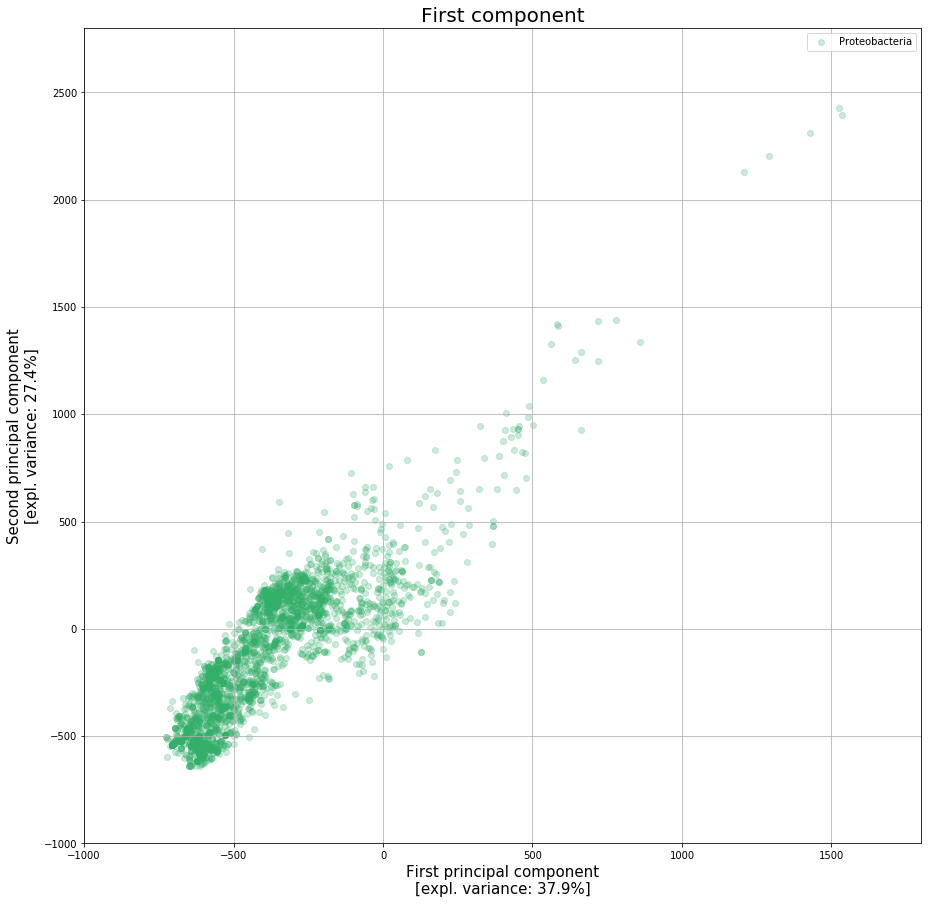

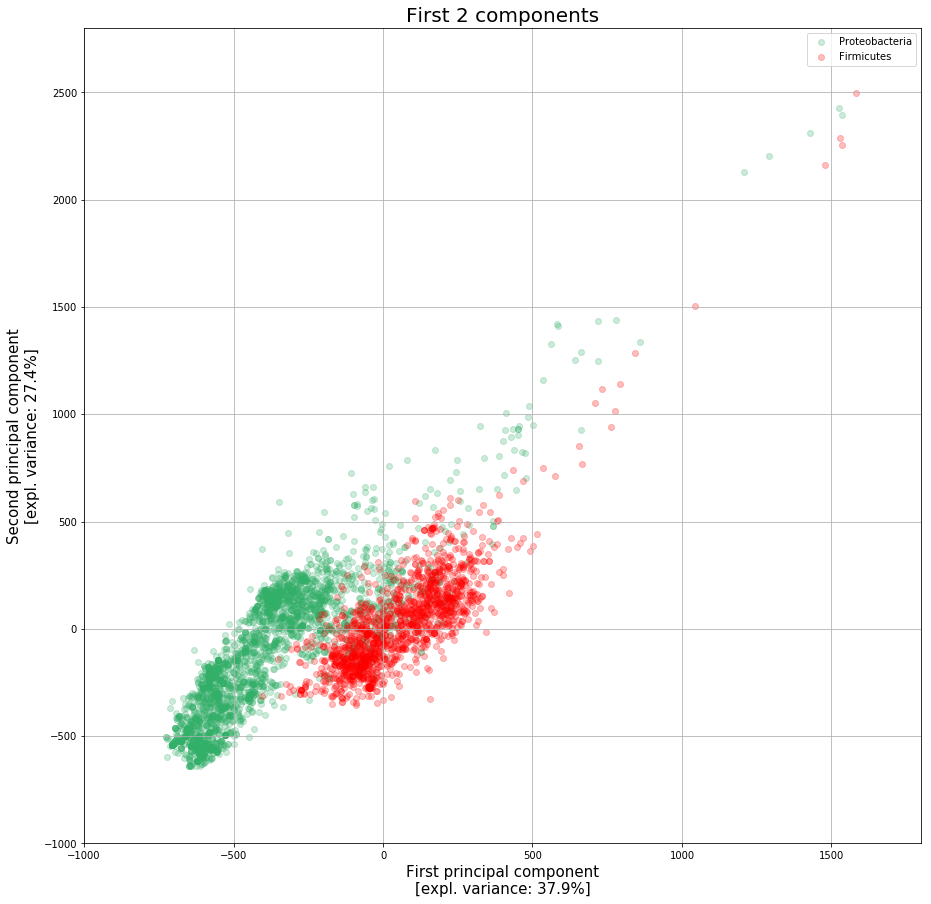

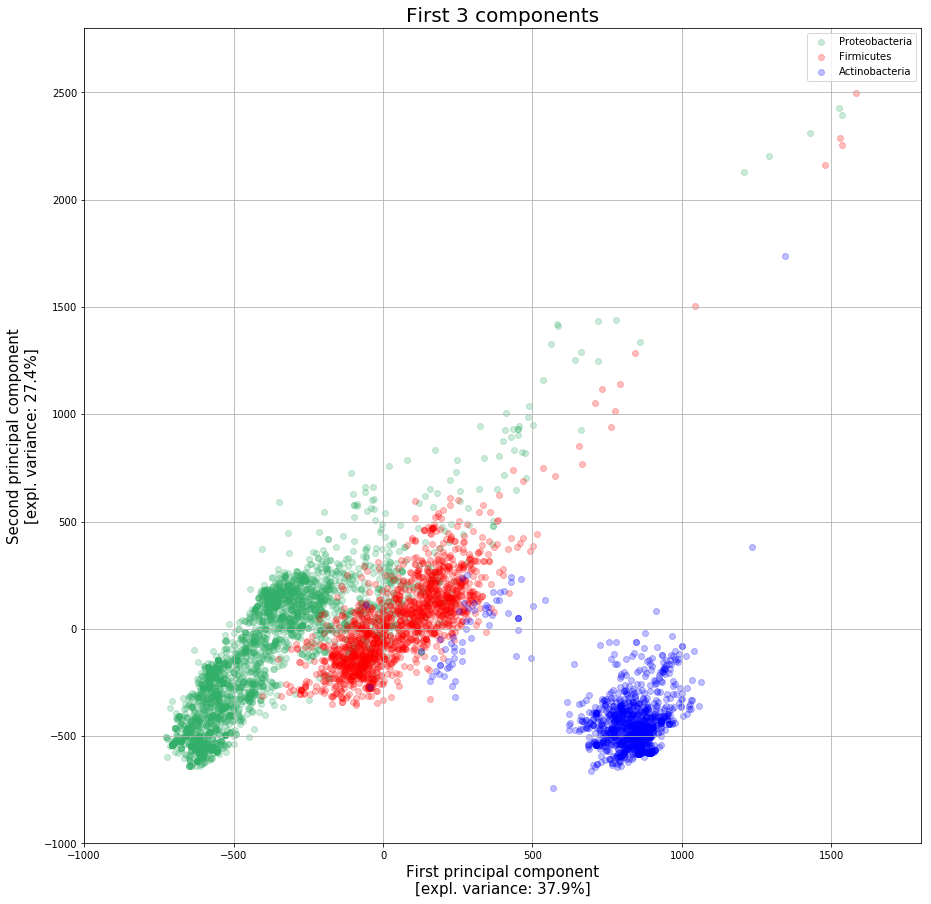

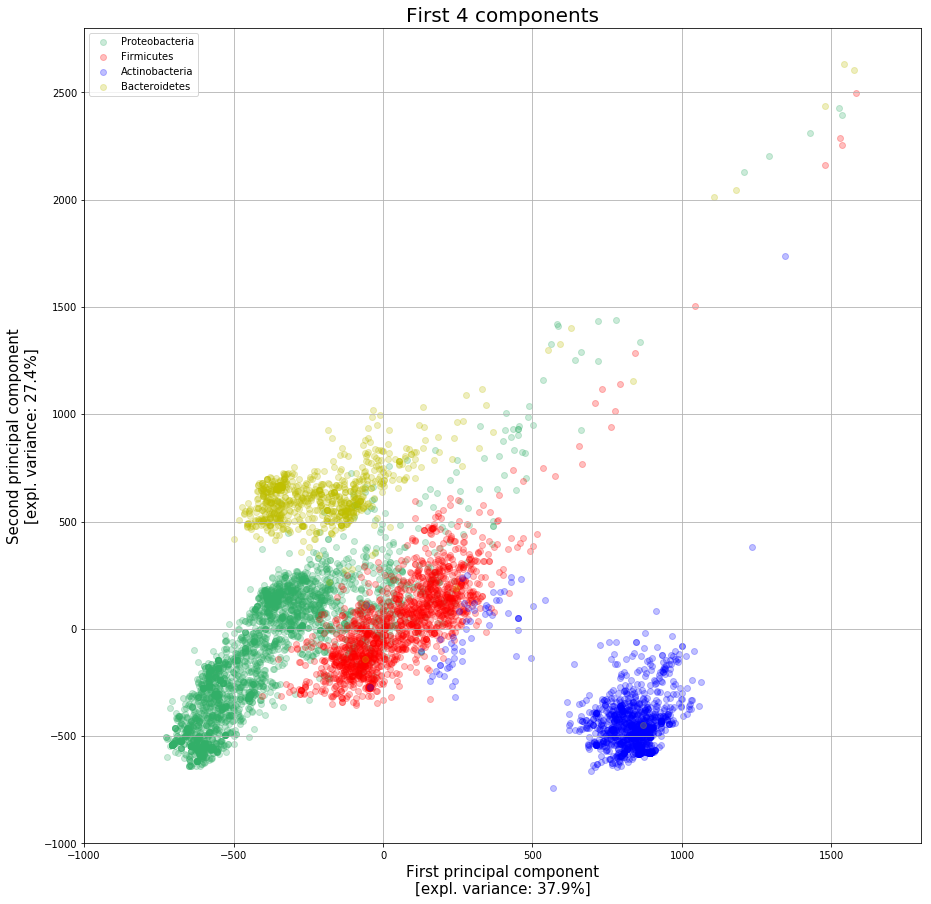

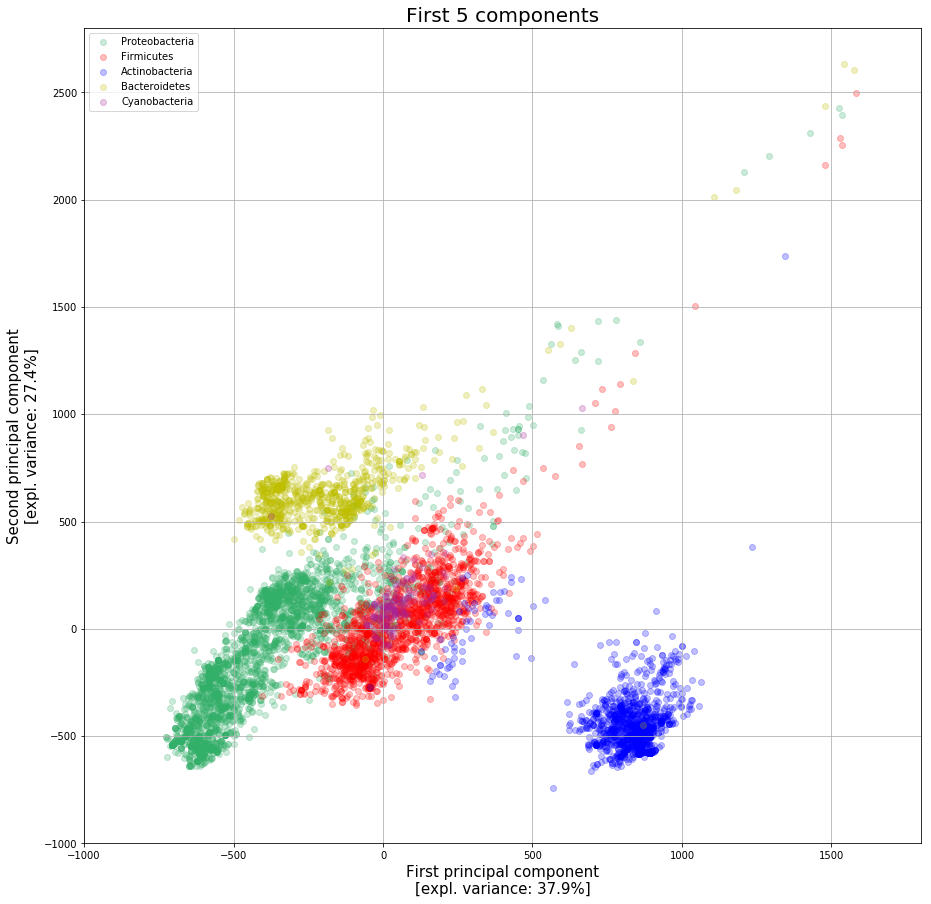

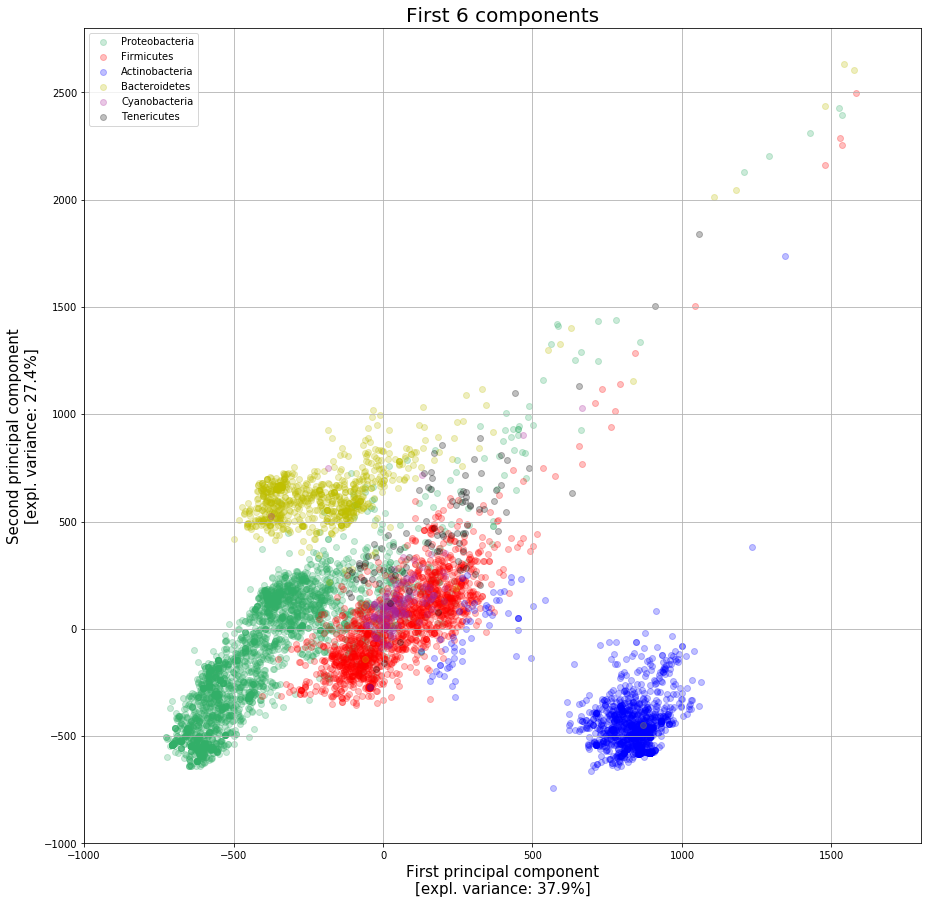

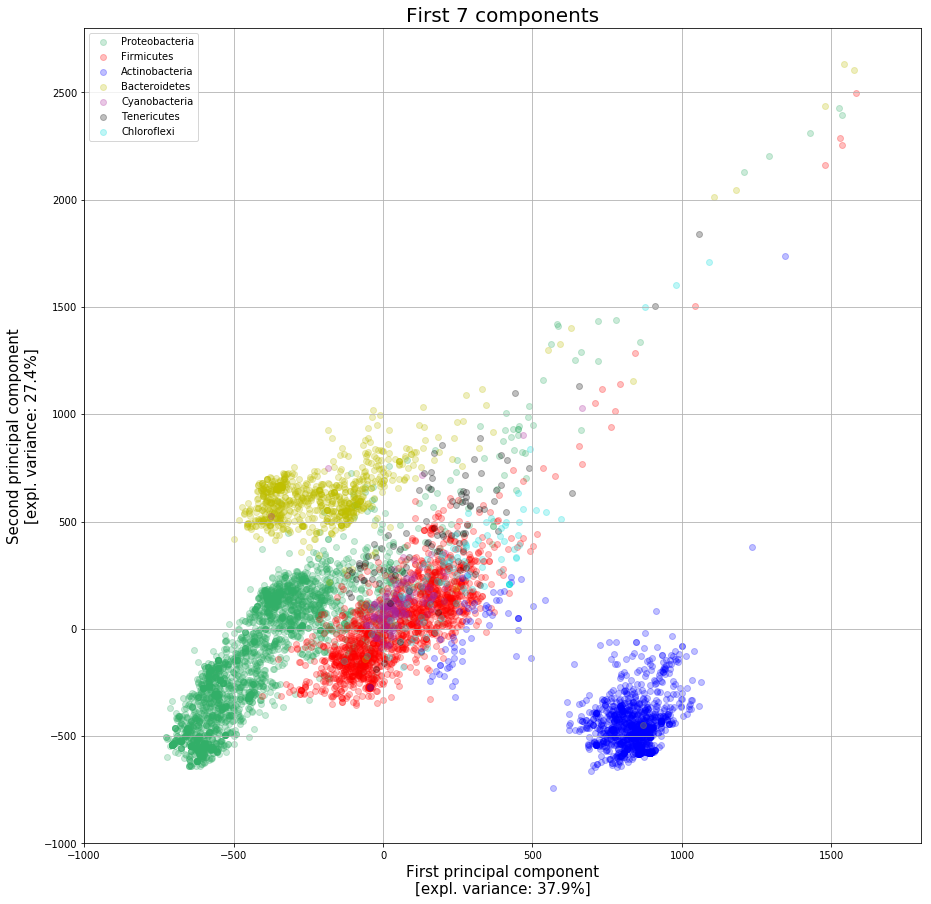

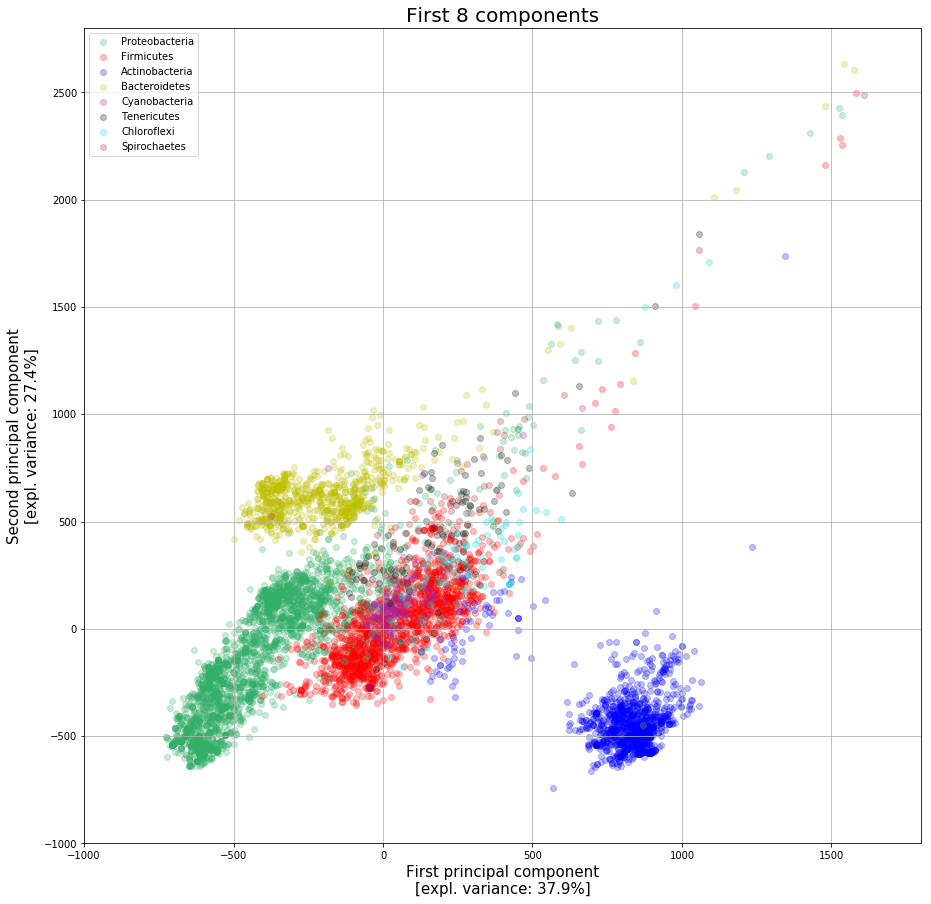

In [30]:
# fixing new intervals
boundx = [-1000,1800]
boundy = [-1000,2800]

A=pd.DataFrame(final).groupby(['phylum']).count().sort_values(by='lengths', ascending=False)['lengths']
cont=np.array(A)
cont

col=['#32af68','r','b','y','#aa2399','k','#00dddd','brown']


cluster2.sort(key=len,reverse=True)
label=phy_name_sort[0:9]


for i in range(1,len(selection_90[:9])):
    plt.figure(figsize=(15,15))
    for j in range(i):
        plot_data = data_projected_clean[selection_90[j]]
        plt.scatter(plot_data[:,0],plot_data[:,1], c=col[j], label=label[j], alpha=0.25)
        plt.ylim(boundy[0],boundy[1])
        plt.xlim(boundx[0],boundx[1])
        if i == 1:
            plt.title("First component", fontsize=20)
        else:
            plt.title("First " + str(j+1) + " components", fontsize=20)
        plt.xlabel('First principal component\n[expl. variance: ' + str("{:.1f}".format(pca_function.explained_variance_ratio_[0]*100)) + '%]', fontsize=15)
        plt.ylabel('Second principal component\n[expl. variance: '+ str("{:.1f}".format(pca_function.explained_variance_ratio_[1]*100)) + '%]', fontsize=15)    
        plt.legend()
    plt.grid()
    plt.show()

Finally, we plot five pie charts to underline that the composition of the clusters, found using the unsupervised algorithm, is made of few phyla only (usually just one). This behaviour is clear in all the graph but the first: infact this one regroups all that points considered as outliers by the algorithm, which, of course, come from several different phyla.

In [31]:
final_clean=final.copy()

final_clean[data_projected_clean[:,0]!=0]=final.iloc[np.where(data_projected_clean[:,0]!=0)]
final_clean[data_projected_clean[:,0]==0]=np.NaN

In [32]:
def func(pct, allvals):
    absolute = int(pct/100.*np.sum(allvals))
    return "{:.2f}%".format(pct, absolute)

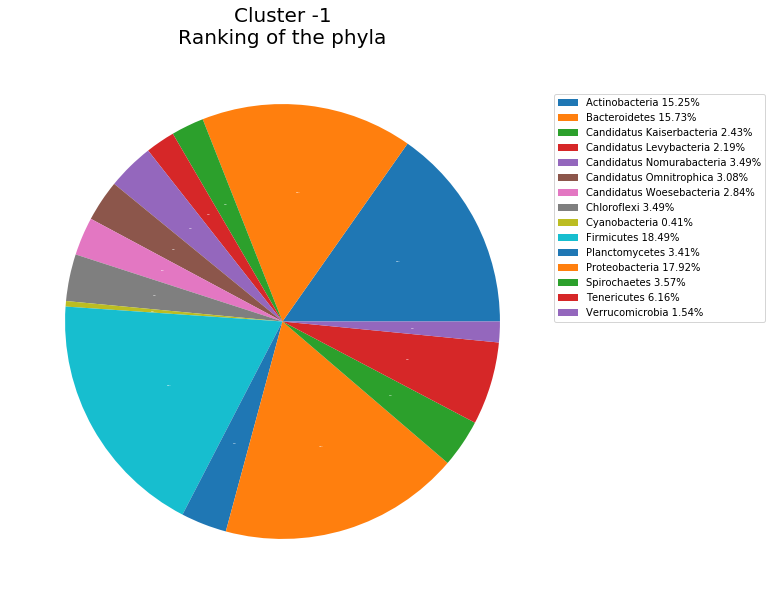

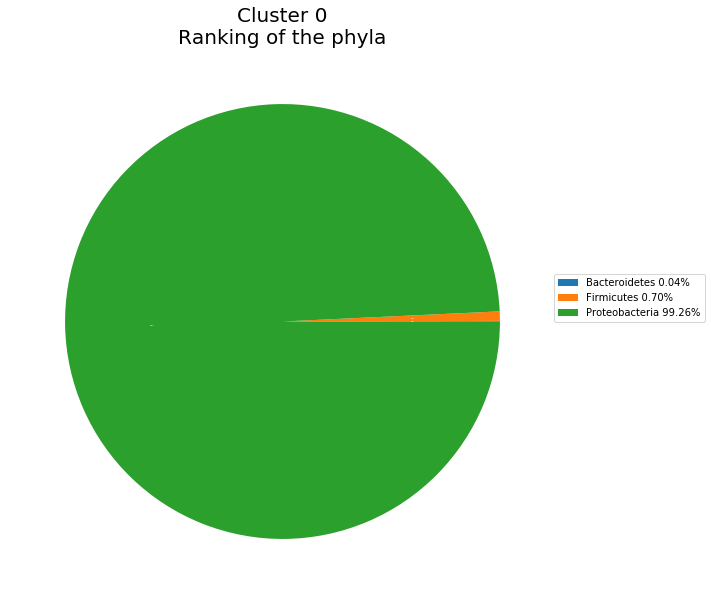

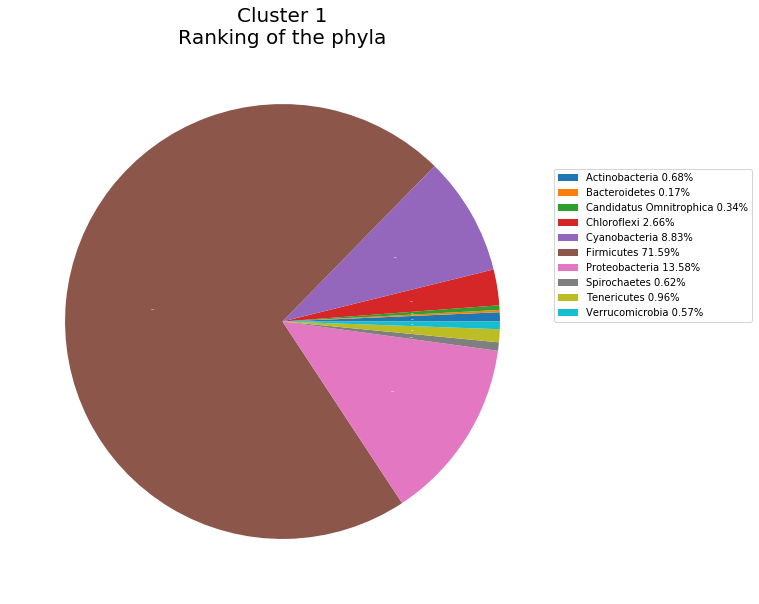

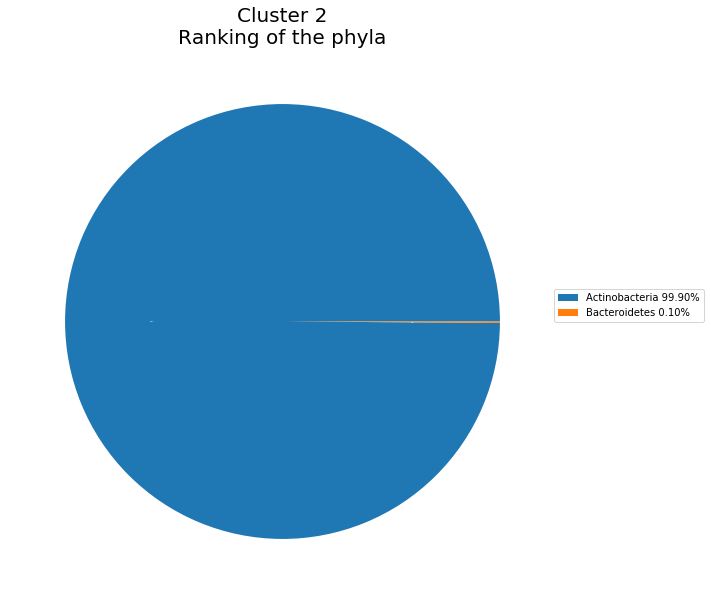

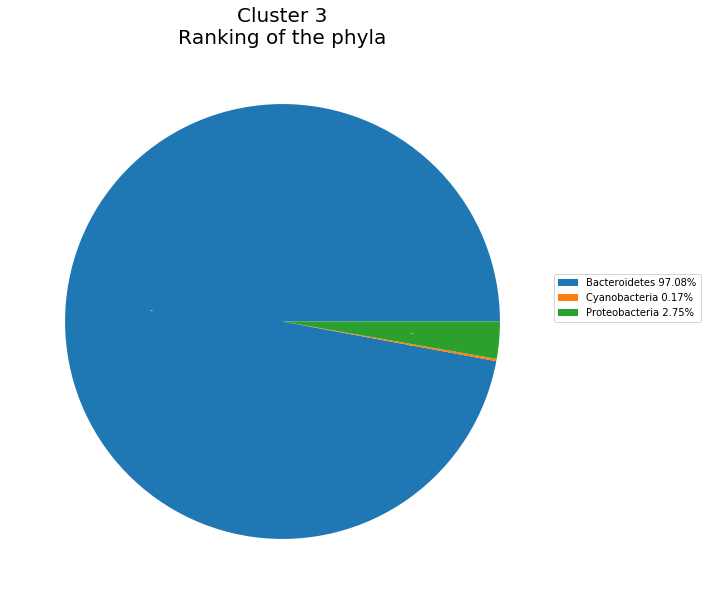

In [33]:
#ordering the phyla on the basis of the number of members in them
for i in range(-1,4):
    distr_phy_df=pd.DataFrame(final_clean.iloc[np.where(db_cluster==i)]).groupby(['phylum']).count()

    distribution1 = [distr_phy_df.index, distr_phy_df['lengths']]
    
    #plotting the resulting distribution
    plt.figure(figsize=(25,10))


    wedges, text, autotexts = plt.pie(distribution1[:][1],
                                      autopct=lambda pct: func(pct, distribution1[:][1]),textprops=dict(color="w"))

    plt.title(r'Cluster '+str(i)+'\nRanking of the phyla', fontsize=20)

    plt.setp(autotexts, size=0, weight="bold")
    
    perc = []
    for ele in autotexts:
        perc.append(str(ele)[str(ele).find("%")-5:str(ele).find("%")+1].replace("'", ""))
 
    current_labels=[]
    for j,k in zip(distribution1[:][0].tolist(),perc):
        current_labels.append(str(j)+str(" ")+str(k))
    plt.legend(loc=(1,0.5), ncol=1, borderaxespad=0., markerscale=2, labels=current_labels)
    plt.show()
    

# CONCLUSION

The results lead primarily to a reassuring result, since the data form groups of clusters which can be recognized with unsupervised algorithms. This means that the protein families (PFAMs) came into play a long time ago, like the taxonomic subdivision does. Moreover it is very relevant that the phylum plotted groups are compact and do not spread.